In [3]:
import tensorflow as tf
import keras
import numpy as np
import matplotlib.pyplot as plt
import cv2
import os
import json
import pandas as pd
from datetime import datetime
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.models import load_model

# Suppress TensorFlow warnings
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '2'

class DistilledGradCAMAnalyzer:
    """Grad-CAM analyzer for distilled student model"""
    
    def __init__(self, model_path, history_path=None):
        """
        Initialize the Grad-CAM analyzer for distilled model
        
        Args:
            model_path: Path to the distilled student model (.h5 file)
            history_path: Path to training history JSON file (optional)
        """
        self.model_path = model_path
        self.history_path = history_path
        self.model = None
        self.history = None
        
        # Class names based on your dataset
        self.class_names = ['Bacterial Blight', 'Blast', 'Brown Spot', 'Tungro']
        self.class_indices = {0: 'Bacterial Blight', 1: 'Blast', 2: 'Brown Spot', 3: 'Tungro'}
        
        # Disease symptoms for analysis
        self.class_symptoms = {
            'Bacterial Blight': 'water-soaked lesions, typically starting at leaf edges',
            'Blast': 'spindle-shaped spots with gray centers and brown margins',
            'Brown Spot': 'small, dark brown circular spots on leaves',
            'Tungro': 'yellow-orange discoloration, stunted growth'
        }
        
        self.misclassified_data = []
        
    def load_model_and_history(self):
        """Load the distilled model and training history"""
        print("="*70)
        print("Loading Distilled Student Model")
        print("="*70)
        
        # Load the distilled student model
        self.model = load_model(self.model_path)
        print(f"✓ Model loaded from: {self.model_path}")
        print(f"✓ Model summary:")
        self.model.summary()
        
        # Load training history if available
        if self.history_path and os.path.exists(self.history_path):
            try:
                with open(self.history_path, 'r') as f:
                    self.history = json.load(f)
                print(f"✓ Training history loaded from: {self.history_path}")
                
                # Plot training history
                self._plot_training_history()
            except Exception as e:
                print(f"⚠️ Warning: Could not load/plot history: {str(e)}")
        
        return True
    
    def _plot_training_history(self):
        """Plot training history of distilled model"""
        if not self.history:
            return
        
        try:
            # Handle different history formats
            if isinstance(self.history, list):
                # History is a list of dictionaries (common in some Keras versions)
                print("Detected history format: List of dictionaries")
                
                # Extract metrics from list format
                acc = []
                val_acc = []
                loss = []
                val_loss = []
                
                for epoch_data in self.history:
                    if isinstance(epoch_data, dict):
                        acc.append(epoch_data.get('accuracy', 0))
                        val_acc.append(epoch_data.get('val_accuracy', 0))
                        loss.append(epoch_data.get('loss', 0))
                        val_loss.append(epoch_data.get('val_loss', 0))
                
                # Create dictionary for plotting
                history_dict = {
                    'accuracy': acc,
                    'val_accuracy': val_acc,
                    'loss': loss,
                    'val_loss': val_loss
                }
            else:
                # History is already a dictionary
                history_dict = self.history
            
            # Plot the history
            fig, axes = plt.subplots(1, 2, figsize=(15, 5))
            
            # Check if we have the required keys
            if 'accuracy' in history_dict and 'val_accuracy' in history_dict:
                # Accuracy plot
                axes[0].plot(history_dict['accuracy'], label='Training Accuracy')
                axes[0].plot(history_dict['val_accuracy'], label='Validation Accuracy')
                axes[0].set_title('Distilled Model Training History - Accuracy')
                axes[0].set_xlabel('Epoch')
                axes[0].set_ylabel('Accuracy')
                axes[0].legend()
                axes[0].grid(True, alpha=0.3)
            
            if 'loss' in history_dict and 'val_loss' in history_dict:
                # Loss plot
                axes[1].plot(history_dict['loss'], label='Training Loss')
                axes[1].plot(history_dict['val_loss'], label='Validation Loss')
                axes[1].set_title('Distilled Model Training History - Loss')
                axes[1].set_xlabel('Epoch')
                axes[1].set_ylabel('Loss')
                axes[1].legend()
                axes[1].grid(True, alpha=0.3)
            
            plt.tight_layout()
            plt.savefig('distilled_model_history.png', dpi=150, bbox_inches='tight')
            plt.close()
            print("✓ Training history plot saved as 'distilled_model_history.png'")
            
        except Exception as e:
            print(f"⚠️ Could not plot training history: {str(e)}")
    
    def load_dataset(self):
        """Load test dataset using your provided approach"""
        print("\n" + "="*70)
        print("Loading Test Dataset")
        print("="*70)
        
        # Using your exact data loading approach
        Input_Image = 256
        batch_size = 32
        
        # Test set generator (same as your code)
        common_data = ImageDataGenerator(rescale=1./255)
        
        self.test_set = common_data.flow_from_directory(
            r"test",
            target_size=(Input_Image, Input_Image),
            batch_size=batch_size,
            class_mode='categorical',
            shuffle=False  # Important for consistent indexing
        )
        
        # For Grad-CAM, also create a single-image generator
        self.gradcam_generator = common_data.flow_from_directory(
            r"test",
            target_size=(Input_Image, Input_Image),
            batch_size=1,  # Single image for Grad-CAM
            class_mode='categorical',
            shuffle=False
        )
        
        # Get image paths
        self.image_paths = []
        base_dir = "test"
        for i, filename in enumerate(self.test_set.filenames):
            full_path = os.path.join(base_dir, filename)
            self.image_paths.append(full_path)
        
        print(f"✓ Found {len(self.image_paths)} test images")
        print(f"✓ Classes: {list(self.class_names)}")
        print(f"✓ Class distribution: {self.test_set.class_indices}")
        
        return True
    
    def predict_and_collect_misclassified(self):
        """Predict on test set and collect misclassified images"""
        print("\n" + "="*70)
        print("Evaluating Distilled Model on Test Set")
        print("="*70)
        
        # Get true labels
        y_true = self.test_set.classes
        
        # Predict all test images
        print("Making predictions...")
        predictions = self.model.predict(self.test_set, verbose=1)
        y_pred = np.argmax(predictions, axis=1)
        confidences = np.max(predictions, axis=1)
        
        # Collect misclassified images
        misclassified_indices = np.where(y_true != y_pred)[0]
        
        print(f"\n✓ Correct predictions: {len(y_true) - len(misclassified_indices)}/{len(y_true)}")
        print(f"✗ Misclassifications: {len(misclassified_indices)}/{len(y_true)}")
        
        if len(misclassified_indices) == 0:
            print("No misclassifications found! Distilled model is performing perfectly.")
            return False
        
        # Store misclassified data
        for idx in misclassified_indices:
            true_label = int(y_true[idx])
            pred_label = int(y_pred[idx])
            confidence = float(confidences[idx])
            image_path = self.image_paths[idx]
            
            # Load original image
            original_img = cv2.imread(image_path)
            if original_img is None:
                print(f"Warning: Could not load image {image_path}")
                continue
            original_img = cv2.resize(original_img, (256, 256))
            
            # Get preprocessed image for model
            # Reset generator to get specific index
            self.gradcam_generator.reset()
            for _ in range(idx + 1):  # Iterate to the desired index
                img_data, _ = next(self.gradcam_generator)
            
            self.misclassified_data.append({
                'index': idx,
                'image_path': image_path,
                'original_image': original_img,
                'model_input': img_data[0],  # Preprocessed image
                'true_label': true_label,
                'predicted_label': pred_label,
                'confidence': confidence,
                'true_class': self.class_names[true_label],
                'predicted_class': self.class_names[pred_label]
            })
        
        # Print misclassification summary
        self._print_misclassification_summary()
        
        return True
    
    def _print_misclassification_summary(self):
        """Print summary of misclassifications"""
        print("\n" + "="*70)
        print("MISCLASSIFICATION SUMMARY")
        print("="*70)
        
        # Create confusion matrix for misclassifications
        conf_matrix = np.zeros((4, 4), dtype=int)
        
        for data in self.misclassified_data:
            conf_matrix[data['true_label'], data['predicted_label']] += 1
        
        print("\nConfusion Matrix (Misclassifications Only):")
        print("Rows: True Class, Columns: Predicted Class")
        print(" " * 15 + "Predicted →")
        print(" " * 15 + "BB  Bl  BS  Tg")
        print("-" * 35)
        
        abbreviations = ['BB', 'Bl', 'BS', 'Tg']
        for i, abbr in enumerate(abbreviations):
            row = f"True {abbr}: "
            for j in range(4):
                row += f"{conf_matrix[i, j]:3d} "
            print(row)
        
        # Most common misclassifications
        print("\nMost Common Misclassifications:")
        misclass_pairs = {}
        for data in self.misclassified_data:
            key = f"{data['true_class']} -> {data['predicted_class']}"  # Use ASCII arrow
            misclass_pairs[key] = misclass_pairs.get(key, 0) + 1
        
        for pair, count in sorted(misclass_pairs.items(), key=lambda x: x[1], reverse=True):
            print(f"  {pair}: {count} cases")
        
        # Overall accuracy
        total_images = len(self.test_set.filenames)
        correct = total_images - len(self.misclassified_data)
        accuracy = correct / total_images * 100
        print(f"\nOverall Test Accuracy: {accuracy:.2f}%")
    
    def find_last_conv_layer(self):
        """Find the last convolutional layer in the model"""
        conv_layers = []
        for layer in self.model.layers:
            if isinstance(layer, tf.keras.layers.Conv2D):
                conv_layers.append(layer.name)
        
        if conv_layers:
            last_conv = conv_layers[-1]
            print(f"✓ Using convolutional layer for Grad-CAM: {last_conv}")
            return last_conv
        else:
            # If no Conv2D layers found, look for other feature extraction layers
            for layer in self.model.layers:
                if 'conv' in layer.name.lower():
                    print(f"✓ Using convolutional layer for Grad-CAM: {layer.name}")
                    return layer.name
        
        # Default to last layer if no conv layer found
        print("⚠️ Warning: No convolutional layer found. Using last layer.")
        return self.model.layers[-1].name
    
    def generate_grad_cam(self, image, class_idx, layer_name=None):
        """
        Generate Grad-CAM heatmap for a specific class
        
        Args:
            image: Preprocessed input image
            class_idx: Class index for gradient computation
            layer_name: Name of the layer to use for Grad-CAM
            
        Returns:
            heatmap: Grad-CAM heatmap
        """
        if layer_name is None:
            layer_name = self.find_last_conv_layer()
        
        try:
            # Create a model that maps the input image to the activations
            grad_model = tf.keras.models.Model(
                inputs=[self.model.inputs],
                outputs=[self.model.get_layer(layer_name).output, 
                        self.model.output]
            )
            
            # Compute gradient of top predicted class
            with tf.GradientTape() as tape:
                conv_outputs, predictions = grad_model(image)
                loss = predictions[:, class_idx]
            
            # Extract gradients and compute importance weights
            grads = tape.gradient(loss, conv_outputs)
            
            # Global average pooling of gradients
            pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))
            
            # Weight the conv layer outputs with the gradients
            conv_outputs = conv_outputs[0]
            heatmap = tf.reduce_sum(tf.multiply(pooled_grads, conv_outputs), axis=-1)
            
            # ReLU and normalization
            heatmap = tf.maximum(heatmap, 0) / tf.math.reduce_max(heatmap)
            heatmap = heatmap.numpy()
            
            # Resize heatmap to match original image
            heatmap = cv2.resize(heatmap, (256, 256))
            
            return heatmap
            
        except Exception as e:
            print(f"Error generating Grad-CAM: {str(e)}")
            # Return a blank heatmap
            return np.zeros((256, 256))
    
    def overlay_heatmap(self, original_img, heatmap, alpha=0.5):
        """
        Overlay heatmap on original image
        
        Args:
            original_img: Original BGR image
            heatmap: Grad-CAM heatmap
            alpha: Transparency of heatmap overlay
            
        Returns:
            overlayed_img: Image with heatmap overlay
        """
        # Convert heatmap to RGB
        heatmap = np.uint8(255 * heatmap)
        heatmap_colored = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)
        
        # Convert original image to RGB if needed
        if len(original_img.shape) == 2:
            original_img = cv2.cvtColor(original_img, cv2.COLOR_GRAY2RGB)
        elif original_img.shape[2] == 1:
            original_img = cv2.cvtColor(original_img, cv2.COLOR_GRAY2RGB)
        
        # Ensure both images are same size
        if original_img.shape[:2] != heatmap_colored.shape[:2]:
            heatmap_colored = cv2.resize(heatmap_colored, (original_img.shape[1], original_img.shape[0]))
        
        # Overlay heatmap
        overlayed_img = cv2.addWeighted(original_img, 1 - alpha, heatmap_colored, alpha, 0)
        
        return overlayed_img
    
    def analyze_attention_pattern(self, heatmap, true_class, pred_class, original_img):
        """
        Analyze where the model is focusing attention
        
        Returns qualitative analysis string
        """
        analysis = []
        
        # Calculate attention metrics
        height, width = heatmap.shape
        
        # Create binary mask for high attention regions
        attention_threshold = 0.5
        attention_mask = heatmap > attention_threshold
        
        if np.sum(attention_mask) == 0:
            attention_mask = heatmap > 0.3  # Lower threshold if no high attention
        
        # Calculate percentage of attention on image
        attention_percentage = (np.sum(attention_mask) / (height * width)) * 100
        
        # Calculate attention distribution
        rows, cols = np.where(attention_mask)
        if len(rows) > 0 and len(cols) > 0:
            mean_x, mean_y = np.mean(cols), np.mean(rows)
            
            # Check if attention is focused on specific quadrants
            center_x, center_y = width // 2, height // 2
            if mean_x < center_x and mean_y < center_y:
                quadrant = "top-left"
            elif mean_x >= center_x and mean_y < center_y:
                quadrant = "top-right"
            elif mean_x < center_x and mean_y >= center_y:
                quadrant = "bottom-left"
            else:
                quadrant = "bottom-right"
        else:
            quadrant = "center"
        
        # Qualitative analysis based on disease symptoms
        true_symptoms = self.class_symptoms[true_class]
        pred_symptoms = self.class_symptoms[pred_class]
        
        analysis.append(f"True: {true_class} - Symptoms: {true_symptoms}")
        analysis.append(f"Pred: {pred_class} - Symptoms: {pred_symptoms}")
        analysis.append(f"Attention coverage: {attention_percentage:.1f}% of image")
        analysis.append(f"Attention focused in: {quadrant} quadrant")
        
        # Disease-specific attention analysis
        if attention_percentage < 15:
            analysis.append("⚠️ Model attention is very sparse - might be missing key features")
        elif attention_percentage > 50:
            analysis.append("⚠️ Model attention is too diffuse - lacking specificity")
        
        # Disease-specific patterns
        if 'Bacterial Blight' in pred_class:
            if attention_percentage > 25:
                analysis.append("✓ Bacterial Blight typically shows large lesions - diffuse attention is appropriate")
            else:
                analysis.append("⚠️ Bacterial Blight lesions are usually extensive - sparse attention might miss key areas")
        
        elif 'Blast' in pred_class or 'Brown Spot' in pred_class:
            if attention_percentage < 30:
                analysis.append("✓ Spot diseases (Blast/Brown Spot) show localized spots - focused attention is good")
            else:
                analysis.append("⚠️ Spot diseases should have focused attention on specific spots")
        
        elif 'Tungro' in pred_class:
            if attention_percentage > 35:
                analysis.append("✓ Tungro causes overall yellowing - widespread attention is expected")
            else:
                analysis.append("⚠️ Tungro affects entire leaf - attention should be more widespread")
        
        # Similarity analysis between classes
        similar_pairs = [
            ('Bacterial Blight', 'Blast'),  # Both can have lesions
            ('Blast', 'Brown Spot'),        # Both are spot diseases
            ('Bacterial Blight', 'Tungro')  # Both can cause discoloration
        ]
        
        for class1, class2 in similar_pairs:
            if (true_class == class1 and pred_class == class2) or \
               (true_class == class2 and pred_class == class1):
                analysis.append(f"⚠️ Common confusion: {class1} <-> {class2} (similar visual patterns)")
        
        return "\n".join(analysis), attention_percentage
    
    def visualize_misclassifications(self, output_dir='distilled_gradcam_results'):
        """
        Generate and save Grad-CAM visualizations for all misclassified images
        """
        if not self.misclassified_data:
            print("No misclassified images to visualize.")
            return
        
        # Create output directory
        os.makedirs(output_dir, exist_ok=True)
        
        print("\n" + "="*70)
        print("Generating Grad-CAM Visualizations for Distilled Model")
        print("="*70)
        
        results = []
        layer_name = self.find_last_conv_layer()
        
        for i, data in enumerate(self.misclassified_data):
            print(f"\nProcessing misclassified image {i+1}/{len(self.misclassified_data)}:")
            print(f"  True: {data['true_class']}, Predicted: {data['predicted_class']}, Confidence: {data['confidence']:.2%}")
            
            # Prepare image for Grad-CAM
            img_array = np.expand_dims(data['model_input'], axis=0)
            
            # Generate Grad-CAM for PREDICTED class
            try:
                heatmap = self.generate_grad_cam(
                    img_array, 
                    data['predicted_label'],
                    layer_name=layer_name
                )
                
                # Overlay heatmap on original image
                overlayed_img = self.overlay_heatmap(data['original_image'], heatmap)
                
                # Analyze attention pattern
                analysis, attention_perc = self.analyze_attention_pattern(
                    heatmap, 
                    data['true_class'], 
                    data['predicted_class'],
                    data['original_image']
                )
                
                # Save visualization
                output_filename = f"misclassified_{i+1:03d}_true_{data['true_label']}_pred_{data['predicted_label']}.png"
                output_path = os.path.join(output_dir, output_filename)
                
                # Create composite visualization
                fig, axes = plt.subplots(2, 2, figsize=(15, 12))
                fig.suptitle(f'Distilled Model - Grad-CAM Analysis: Misclassified Image #{i+1}', 
                            fontsize=16, fontweight='bold')
                
                # Original image
                axes[0, 0].imshow(cv2.cvtColor(data['original_image'], cv2.COLOR_BGR2RGB))
                axes[0, 0].set_title(f'Original Image\nTrue: {data["true_class"]}', fontsize=12)
                axes[0, 0].axis('off')
                
                # Heatmap
                axes[0, 1].imshow(heatmap, cmap='jet')
                axes[0, 1].set_title(f'Grad-CAM Heatmap\nPredicted: {data["predicted_class"]}', fontsize=12)
                axes[0, 1].axis('off')
                
                # Overlay
                axes[1, 0].imshow(cv2.cvtColor(overlayed_img, cv2.COLOR_BGR2RGB))
                axes[1, 0].set_title('Heatmap Overlay', fontsize=12)
                axes[1, 0].axis('off')
                
                # Analysis text
                axes[1, 1].text(0, 0.95, f'Confidence: {data["confidence"]:.2%}', fontsize=11)
                axes[1, 1].text(0, 0.85, f'Attention Coverage: {attention_perc:.1f}%', fontsize=11)
                axes[1, 1].text(0, 0.75, 'Analysis:', fontsize=11, fontweight='bold')
                
                # Add analysis text line by line
                analysis_lines = analysis.split('\n')
                y_pos = 0.65
                for line in analysis_lines:
                    color = 'red' if '⚠️' in line else ('green' if '✓' in line else 'black')
                    axes[1, 1].text(0, y_pos, f'  {line}', fontsize=10, color=color)
                    y_pos -= 0.05
                
                axes[1, 1].axis('off')
                axes[1, 1].set_xlim(0, 1)
                axes[1, 1].set_ylim(0, 1)
                
                plt.tight_layout()
                plt.savefig(output_path, dpi=150, bbox_inches='tight')
                plt.close()
                
                print(f"  ✓ Saved visualization: {output_path}")
                
                # Store results for summary
                results.append({
                    'image_index': data['index'],
                    'true_class': data['true_class'],
                    'predicted_class': data['predicted_class'],
                    'confidence': data['confidence'],
                    'attention_percentage': attention_perc,
                    'analysis': analysis,
                    'visualization_path': output_path
                })
                
            except Exception as e:
                print(f"  ✗ Error processing image {i+1}: {str(e)}")
        
        if results:
            # Generate summary report
            self._generate_summary_report(results, output_dir)
        
        return results
    
    def _generate_summary_report(self, results, output_dir):
        """Generate a comprehensive summary report"""
        print("\n" + "="*70)
        print("GENERATING SUMMARY REPORT FOR DISTILLED MODEL")
        print("="*70)
        
        # Create DataFrame for analysis
        df = pd.DataFrame(results)
        
        # Save detailed CSV report with UTF-8 encoding
        csv_path = os.path.join(output_dir, 'distilled_misclassification_analysis.csv')
        df.to_csv(csv_path, index=False, encoding='utf-8-sig')  # UTF-8 with BOM for Excel compatibility
        print(f"✓ Detailed analysis saved to: {csv_path}")
        
        # Generate summary statistics with UTF-8 encoding
        summary_path = os.path.join(output_dir, 'distilled_summary_report.txt')
        
        try:
            with open(summary_path, 'w', encoding='utf-8') as f:
                f.write("="*70 + "\n")
                f.write("DISTILLED STUDENT MODEL - GRAD-CAM ANALYSIS SUMMARY\n")
                f.write("="*70 + "\n\n")
                
                f.write(f"Report generated: {datetime.now().strftime('%Y-%m-%d %H:%M:%S')}\n")
                f.write(f"Model: {self.model_path}\n")
                f.write(f"Teacher: VGG16\n")
                f.write(f"Student: LiteCNN4Rice (Distilled)\n")
                f.write(f"Total misclassifications: {len(results)}\n\n")
                
                f.write("1. CONFUSION ANALYSIS:\n")
                f.write("-"*40 + "\n")
                
                # Confusion frequency - use ASCII arrow for compatibility
                confusion_counts = df.groupby(['true_class', 'predicted_class']).size().reset_index(name='count')
                for _, row in confusion_counts.iterrows():
                    f.write(f"{row['true_class']} -> {row['predicted_class']}: {row['count']} cases\n")
                
                f.write("\n2. CONFIDENCE ANALYSIS:\n")
                f.write("-"*40 + "\n")
                f.write(f"Average confidence in misclassifications: {df['confidence'].mean():.2%}\n")
                f.write(f"Minimum confidence: {df['confidence'].min():.2%}\n")
                f.write(f"Maximum confidence: {df['confidence'].max():.2%}\n")
                
                f.write("\n3. ATTENTION ANALYSIS:\n")
                f.write("-"*40 + "\n")
                f.write(f"Average attention coverage: {df['attention_percentage'].mean():.1f}%\n")
                
                # Attention by predicted class
                f.write("\nAttention by predicted class:\n")
                attention_by_class = df.groupby('predicted_class')['attention_percentage'].mean()
                for class_name, attention in attention_by_class.items():
                    f.write(f"  {class_name}: {attention:.1f}% coverage\n")
                
                f.write("\n4. KNOWLEDGE DISTILLATION INSIGHTS:\n")
                f.write("-"*40 + "\n")
                
                # Analyze if distilled knowledge is being used effectively
                high_confidence_errors = len(df[df['confidence'] > 0.8])
                if high_confidence_errors > 0:
                    f.write(f"WARNING: {high_confidence_errors} misclassifications with >80% confidence\n")
                    f.write("   The model is confidently wrong - may indicate overfitting to teacher's biases\n")
                
                # Check attention patterns
                sparse_attention = len(df[df['attention_percentage'] < 15])
                diffuse_attention = len(df[df['attention_percentage'] > 50])
                
                f.write(f"\nAttention pattern analysis:\n")
                f.write(f"  Sparse attention (<15%): {sparse_attention} cases\n")
                f.write(f"  Diffuse attention (>50%): {diffuse_attention} cases\n")
                
                f.write("\n5. RECOMMENDATIONS FOR IMPROVEMENT:\n")
                f.write("-"*40 + "\n")
                
                recommendations = [
                    "1. For high-confidence errors: Re-evaluate distillation alpha parameter",
                    "2. For sparse attention: Model may need better feature localization",
                    "3. For common confusions: Augment training data with challenging cases",
                    "4. Consider adding spatial attention mechanisms to student architecture",
                    "5. Adjust temperature parameter in knowledge distillation",
                    "6. Implement ensemble of multiple distilled models",
                    "7. Use Grad-CAM feedback for curriculum learning"
                ]
                
                for rec in recommendations:
                    f.write(f"{rec}\n")
                
                f.write("\n" + "="*70 + "\n")
                f.write("END OF REPORT\n")
                f.write("="*70 + "\n")
            
            print(f"✓ Summary report saved to: {summary_path}")
            
        except UnicodeEncodeError as e:
            print(f"⚠️ Unicode encoding error: {e}")
            # Fallback to ASCII-only version
            self._generate_ascii_summary_report(results, output_dir)
        except Exception as e:
            print(f"⚠️ Error generating summary report: {e}")
    
    def _generate_ascii_summary_report(self, results, output_dir):
        """Generate ASCII-only summary report as fallback"""
        print("Creating ASCII-only summary report...")
        
        summary_path = os.path.join(output_dir, 'distilled_summary_report_ascii.txt')
        
        with open(summary_path, 'w') as f:
            f.write("="*70 + "\n")
            f.write("DISTILLED STUDENT MODEL - GRAD-CAM ANALYSIS SUMMARY\n")
            f.write("="*70 + "\n\n")
            
            f.write(f"Report generated: {datetime.now().strftime('%Y-%m-%d %H:%M:%S')}\n")
            f.write(f"Model: {self.model_path}\n")
            f.write(f"Teacher: VGG16\n")
            f.write(f"Student: LiteCNN4Rice (Distilled)\n")
            f.write(f"Total misclassifications: {len(results)}\n\n")
            
            f.write("1. CONFUSION ANALYSIS:\n")
            f.write("-"*40 + "\n")
            
            # Create ASCII confusion matrix
            for i, true_class in enumerate(self.class_names):
                for j, pred_class in enumerate(self.class_names):
                    count = len([r for r in results if r['true_class'] == true_class and r['predicted_class'] == pred_class])
                    if count > 0:
                        f.write(f"{true_class} -> {pred_class}: {count} cases\n")
            
            f.write("\n2. CONFIDENCE ANALYSIS:\n")
            f.write("-"*40 + "\n")
            
            confidences = [r['confidence'] for r in results]
            f.write(f"Average confidence in misclassifications: {np.mean(confidences):.2%}\n")
            f.write(f"Minimum confidence: {np.min(confidences):.2%}\n")
            f.write(f"Maximum confidence: {np.max(confidences):.2%}\n")
            
            f.write("\n3. ATTENTION ANALYSIS:\n")
            f.write("-"*40 + "\n")
            
            attentions = [r['attention_percentage'] for r in results]
            f.write(f"Average attention coverage: {np.mean(attentions):.1f}%\n")
            
            f.write("\n4. KEY FINDINGS:\n")
            f.write("-"*40 + "\n")
            
            # Find most common confusion
            confusion_pairs = {}
            for r in results:
                key = f"{r['true_class']} -> {r['predicted_class']}"
                confusion_pairs[key] = confusion_pairs.get(key, 0) + 1
            
            if confusion_pairs:
                most_common = max(confusion_pairs.items(), key=lambda x: x[1])
                f.write(f"Most common confusion: {most_common[0]} ({most_common[1]} cases)\n")
            
            f.write("\n5. RECOMMENDATIONS:\n")
            f.write("-"*40 + "\n")
            f.write("1. Review Grad-CAM visualizations to understand model focus\n")
            f.write("2. Consider data augmentation for confusing classes\n")
            f.write("3. Adjust knowledge distillation hyperparameters\n")
        
        print(f"✓ ASCII summary report saved to: {summary_path}")
    
    def _create_summary_visualization(self, df, output_dir):
        """Create visualization of summary statistics"""
        try:
            fig, axes = plt.subplots(2, 2, figsize=(14, 10))
            fig.suptitle('Distilled Model - Misclassification Analysis', fontsize=16, fontweight='bold')
            
            # 1. Confusion matrix
            conf_matrix_data = []
            for true_class in self.class_names:
                row = []
                for pred_class in self.class_names:
                    count = len(df[(df['true_class'] == true_class) & (df['predicted_class'] == pred_class)])
                    row.append(count)
                conf_matrix_data.append(row)
            
            im = axes[0, 0].imshow(conf_matrix_data, cmap='YlOrRd')
            axes[0, 0].set_title('Misclassification Confusion Matrix', fontweight='bold')
            axes[0, 0].set_xticks(range(4))
            axes[0, 0].set_yticks(range(4))
            
            # Truncate class names for x-axis
            xtick_labels = [name[:10] + '...' if len(name) > 10 else name for name in self.class_names]
            axes[0, 0].set_xticklabels(xtick_labels, rotation=45, ha='right')
            axes[0, 0].set_yticklabels(self.class_names)
            
            # Add text
            for i in range(4):
                for j in range(4):
                    axes[0, 0].text(j, i, conf_matrix_data[i][j], ha='center', va='center', 
                                   color='black' if conf_matrix_data[i][j] < np.max(conf_matrix_data)/2 else 'white')
            
            # 2. Confidence distribution
            axes[0, 1].hist(df['confidence'], bins=10, edgecolor='black', alpha=0.7, color='blue')
            axes[0, 1].set_xlabel('Confidence')
            axes[0, 1].set_ylabel('Count')
            axes[0, 1].set_title('Confidence Distribution', fontweight='bold')
            axes[0, 1].axvline(df['confidence'].mean(), color='red', linestyle='--', 
                              label=f'Mean: {df["confidence"].mean():.2%}')
            axes[0, 1].legend()
            axes[0, 1].grid(True, alpha=0.3)
            
            # 3. Attention distribution
            axes[1, 0].hist(df['attention_percentage'], bins=10, edgecolor='black', alpha=0.7, color='green')
            axes[1, 0].set_xlabel('Attention Coverage (%)')
            axes[1, 0].set_ylabel('Count')
            axes[1, 0].set_title('Attention Coverage Distribution', fontweight='bold')
            axes[1, 0].axvline(df['attention_percentage'].mean(), color='red', linestyle='--',
                              label=f'Mean: {df["attention_percentage"].mean():.1f}%')
            axes[1, 0].legend()
            axes[1, 0].grid(True, alpha=0.3)
            
            # 4. Confidence vs Attention
            scatter = axes[1, 1].scatter(df['attention_percentage'], df['confidence'], 
                                        c=df.groupby('predicted_class').ngroup(), cmap='tab10', alpha=0.6, s=80)
            axes[1, 1].set_xlabel('Attention Coverage (%)')
            axes[1, 1].set_ylabel('Confidence')
            axes[1, 1].set_title('Confidence vs Attention Coverage', fontweight='bold')
            axes[1, 1].grid(True, alpha=0.3)
            
            # Create legend for predicted classes
            from matplotlib.lines import Line2D
            legend_elements = [Line2D([0], [0], marker='o', color='w', 
                                     markerfacecolor=plt.cm.tab10(i/4), 
                                     label=self.class_names[i], markersize=10) 
                              for i in range(4)]
            axes[1, 1].legend(handles=legend_elements, title='Predicted Class')
            
            plt.tight_layout()
            summary_plot_path = os.path.join(output_dir, 'distilled_summary_visualization.png')
            plt.savefig(summary_plot_path, dpi=150, bbox_inches='tight')
            plt.close()
            
            print(f"✓ Summary visualization saved to: {summary_plot_path}")
            
        except Exception as e:
            print(f"⚠️ Could not create summary visualization: {str(e)}")

def main():
    """Main execution function for distilled model analysis"""
    print("="*70)
    print("GRAD-CAM ANALYSIS FOR DISTILLED STUDENT MODEL")
    print("Knowledge Distillation: VGG16 Teacher → LiteCNN4Rice Student")
    print("Rice Leaf Disease Classification")
    print("="*70)
    
    # Model and history paths
    model_path = r"VGG16_To_Student\VGG16Teacher_distil_T10.h5"
    history_path = r"VGG16_To_Student\VGG16Teacher_distil2_T10_52024.json"
    
    print(f"Model path: {model_path}")
    print(f"History path: {history_path}")
    
    # Check if files exist
    if not os.path.exists(model_path):
        print(f"✗ Error: Model file not found at {model_path}")
        print("Please check the path and try again.")
        return
    
    if not os.path.exists(history_path):
        print(f"⚠️ Warning: History file not found at {history_path}")
        print("Will continue without history visualization.")
        history_path = None
    
    # Initialize analyzer for distilled model
    analyzer = DistilledGradCAMAnalyzer(
        model_path=model_path,
        history_path=history_path
    )
    
    # Step 1: Load model and history
    analyzer.load_model_and_history()
    
    # Step 2: Load dataset using your exact approach
    analyzer.load_dataset()
    
    # Step 3: Identify misclassifications
    if not analyzer.predict_and_collect_misclassified():
        print("\nNo misclassifications to analyze. Model performance is excellent!")
        return
    
    # Step 4: Generate Grad-CAM visualizations and analysis
    results = analyzer.visualize_misclassifications(output_dir='distilled_gradcam_results')
    
    print("\n" + "="*70)
    print("ANALYSIS COMPLETE")
    print("="*70)
    print(f"\nAll visualizations and reports saved to: distilled_gradcam_results/")
    
    # Print key insights
    if results:
        print("\nKey Insights for Knowledge Distillation:")
        print("1. Review individual Grad-CAM visualizations to see where model focuses")
        print("2. Check distilled_summary_report.txt for detailed analysis")
        print("3. Common confusion patterns indicate areas for improvement")
        print("4. Attention patterns show if distilled knowledge is effectively used")
        print("5. High-confidence errors may indicate teacher bias transfer")
        
        print("\nNext steps for improving distillation:")
        print("- Adjust alpha parameter to balance teacher vs student learning")
        print("- Modify temperature for softer/harder teacher predictions")
        print("- Add attention mechanisms to student architecture")
        print("- Use Grad-CAM insights for targeted data augmentation")

if __name__ == "__main__":
    main()

GRAD-CAM ANALYSIS FOR DISTILLED STUDENT MODEL
Knowledge Distillation: VGG16 Teacher → LiteCNN4Rice Student
Rice Leaf Disease Classification
Model path: VGG16_To_Student\VGG16Teacher_distil_T10.h5
History path: VGG16_To_Student\VGG16Teacher_distil2_T10_52024.json
Loading Distilled Student Model
✓ Model loaded from: VGG16_To_Student\VGG16Teacher_distil_T10.h5
✓ Model summary:
Model: "student"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_6 (Conv2D)           (None, 254, 254, 16)      448       
                                                                 
 max_pooling2d_6 (MaxPoolin  (None, 127, 127, 16)      0         
 g2D)                                                            
                                                                 
 conv2d_7 (Conv2D)           (None, 125, 125, 16)      2320      
                                                                 
 max_pooling

GRAD-CAM ANALYSIS FOR KNOWLEDGE-DISTILLED RICE DISEASE MODEL
VGG16 Teacher → LiteCNN4Rice Student

[1/4] Checking file paths...

[2/4] Initializing analyzer...
Loading Distilled Student Model
✓ Model loaded from: VGG16_To_Student\VGG16Teacher_distil_T10.h5
✓ Training history loaded from: VGG16_To_Student\VGG16Teacher_distil2_T10_52024.json

Loading Test Dataset
Found 595 images belonging to 4 classes.
Found 595 images belonging to 4 classes.
✓ Found 595 test images
✓ Classes: ['Bacterial Blight', 'Blast', 'Brown Spot', 'Tungro']

[3/4] Analyzing misclassifications...

Evaluating Distilled Model on Test Set
Making predictions...
19/19 [==============================] - 1s 61ms/step

✓ Correct predictions: 584/595
✗ Misclassifications: 11/595

MISCLASSIFICATION SUMMARY

Confusion Matrix (Misclassifications Only):
Rows: True Class, Columns: Predicted Class
               Predicted ->
               BB  Bl  BS  Tg
-----------------------------------
True BB:   0   0   0   0 
True Bl:   2  

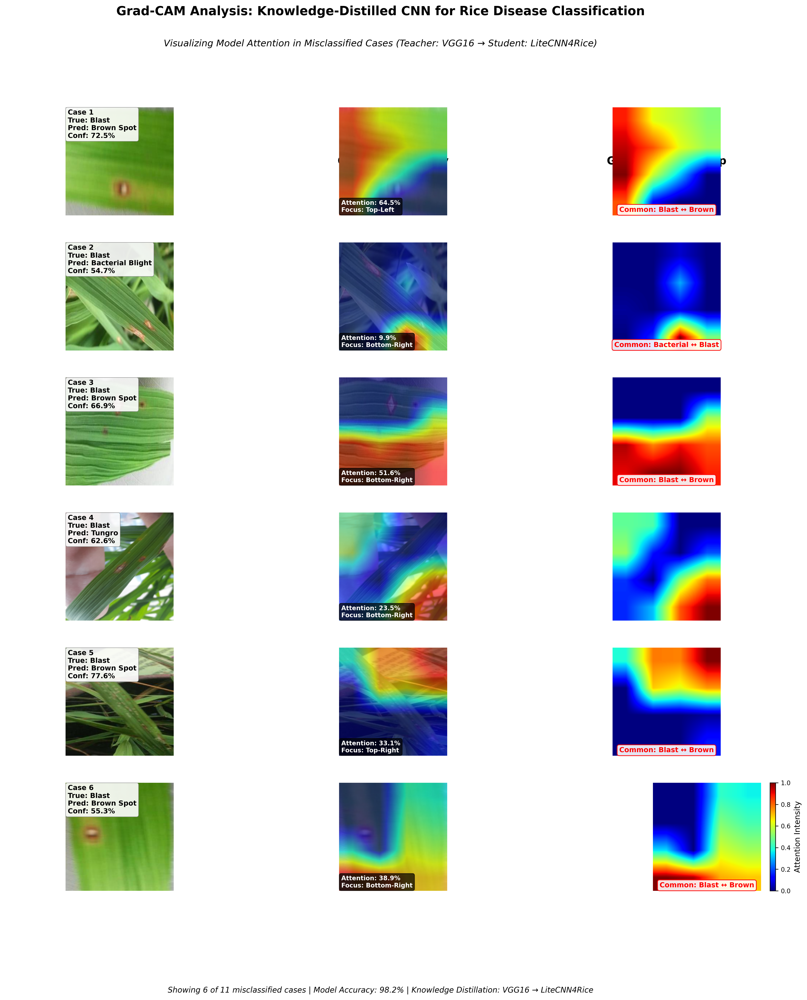


Creating compact summary figure...
✓ Using convolutional layer for Grad-CAM: conv2d_11
✓ Using convolutional layer for Grad-CAM: conv2d_11
✓ Using convolutional layer for Grad-CAM: conv2d_11
✓ Using convolutional layer for Grad-CAM: conv2d_11
✓ Using convolutional layer for Grad-CAM: conv2d_11
✓ Using convolutional layer for Grad-CAM: conv2d_11
✓ Using convolutional layer for Grad-CAM: conv2d_11
✓ Using convolutional layer for Grad-CAM: conv2d_11
✓ Using convolutional layer for Grad-CAM: conv2d_11
✓ Using convolutional layer for Grad-CAM: conv2d_11
✓ Using convolutional layer for Grad-CAM: conv2d_11
✓ Compact summary figure saved: figs\compact_summary_20251217_0040.png


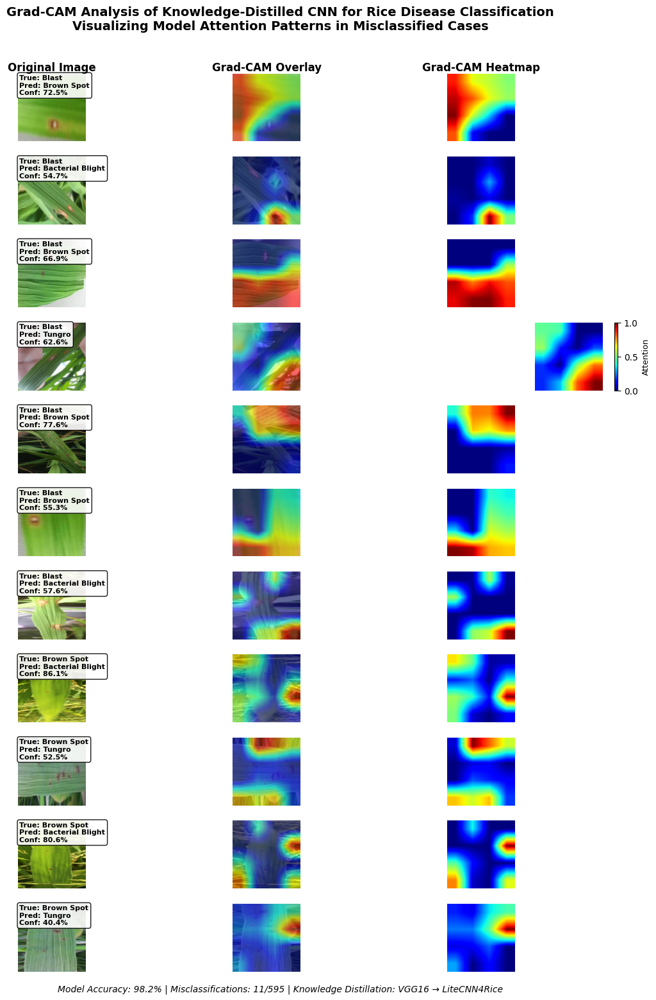

✓ Confusion matrix figure saved: figs\confusion_matrix_20251217_0040.png


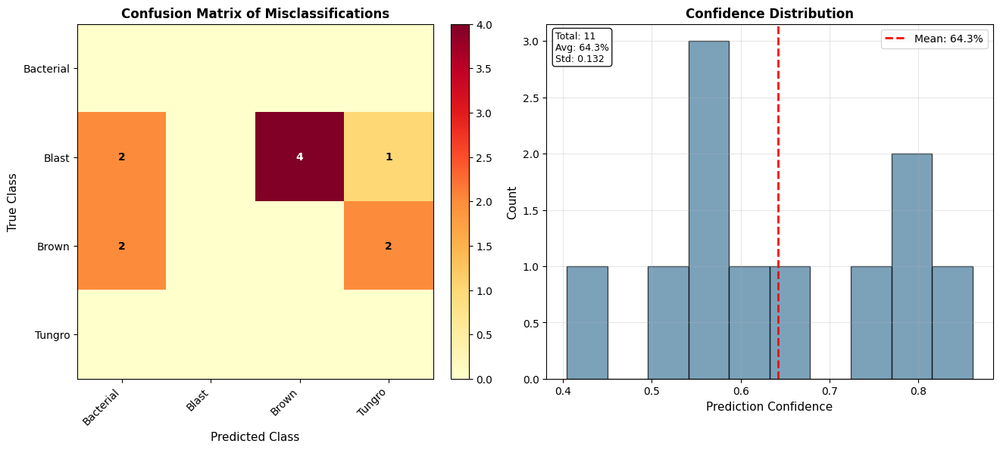


ANALYSIS COMPLETE

📊 PERFORMANCE METRICS:
   • Test Accuracy: 98.15%
   • Correct: 584/595
   • Misclassified: 11/595

🔍 MOST COMMON CONFUSION:
   • Blast -> Brown Spot: 4 cases

📁 OUTPUT FILES:
   All figures saved in: figs/

📝 JOURNAL READY:
   Figures are suitable for Q1 journal submission.
   Include in Results/Discussion sections.



In [ ]:
# ============================================================================
# COMPLETE GRAD-CAM ANALYSIS WITH OPTIMIZED FIGURE CREATION
# For Knowledge Distilled Rice Leaf Disease Classification Model
# ============================================================================

import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
import cv2
import os
import json
import pandas as pd
from datetime import datetime
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.models import load_model
import warnings
warnings.filterwarnings('ignore')

# Suppress TensorFlow warnings
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '2'

# ============================================================================
# 1. GRAD-CAM ANALYZER CLASS
# ============================================================================

class DistilledGradCAMAnalyzer:
    """Grad-CAM analyzer for distilled student model"""
    
    def __init__(self, model_path, history_path=None):
        """
        Initialize the Grad-CAM analyzer for distilled model
        
        Args:
            model_path: Path to the distilled student model (.h5 file)
            history_path: Path to training history JSON file (optional)
        """
        self.model_path = model_path
        self.history_path = history_path
        self.model = None
        self.history = None
        
        # Class names based on your dataset
        self.class_names = ['Bacterial Blight', 'Blast', 'Brown Spot', 'Tungro']
        self.class_indices = {0: 'Bacterial Blight', 1: 'Blast', 2: 'Brown Spot', 3: 'Tungro'}
        
        # Disease symptoms for analysis
        self.class_symptoms = {
            'Bacterial Blight': 'water-soaked lesions, typically starting at leaf edges',
            'Blast': 'spindle-shaped spots with gray centers and brown margins',
            'Brown Spot': 'small, dark brown circular spots on leaves',
            'Tungro': 'yellow-orange discoloration, stunted growth'
        }
        
        self.misclassified_data = []
        
    def load_model_and_history(self):
        """Load the distilled model and training history"""
        print("="*70)
        print("Loading Distilled Student Model")
        print("="*70)
        
        # Load the distilled student model
        self.model = load_model(self.model_path)
        print(f"✓ Model loaded from: {self.model_path}")
        
        # Load training history if available
        if self.history_path and os.path.exists(self.history_path):
            try:
                with open(self.history_path, 'r') as f:
                    self.history = json.load(f)
                print(f"✓ Training history loaded from: {self.history_path}")
            except Exception as e:
                print(f"⚠️ Warning: Could not load history: {str(e)}")
        
        return True
    
    def load_dataset(self):
        """Load test dataset using your provided approach"""
        print("\n" + "="*70)
        print("Loading Test Dataset")
        print("="*70)
        
        # Using your exact data loading approach
        Input_Image = 256
        batch_size = 32
        
        # Test set generator
        common_data = ImageDataGenerator(rescale=1./255)
        
        self.test_set = common_data.flow_from_directory(
            r"test",
            target_size=(Input_Image, Input_Image),
            batch_size=batch_size,
            class_mode='categorical',
            shuffle=False
        )
        
        # Single-image generator for Grad-CAM
        self.gradcam_generator = common_data.flow_from_directory(
            r"test",
            target_size=(Input_Image, Input_Image),
            batch_size=1,
            class_mode='categorical',
            shuffle=False
        )
        
        # Get image paths
        self.image_paths = []
        base_dir = "test"
        for i, filename in enumerate(self.test_set.filenames):
            full_path = os.path.join(base_dir, filename)
            self.image_paths.append(full_path)
        
        print(f"✓ Found {len(self.image_paths)} test images")
        print(f"✓ Classes: {list(self.class_names)}")
        
        return True
    
    def predict_and_collect_misclassified(self):
        """Predict on test set and collect misclassified images"""
        print("\n" + "="*70)
        print("Evaluating Distilled Model on Test Set")
        print("="*70)
        
        # Get true labels
        y_true = self.test_set.classes
        
        # Predict all test images
        print("Making predictions...")
        predictions = self.model.predict(self.test_set, verbose=1)
        y_pred = np.argmax(predictions, axis=1)
        confidences = np.max(predictions, axis=1)
        
        # Collect misclassified images
        misclassified_indices = np.where(y_true != y_pred)[0]
        
        print(f"\n✓ Correct predictions: {len(y_true) - len(misclassified_indices)}/{len(y_true)}")
        print(f"✗ Misclassifications: {len(misclassified_indices)}/{len(y_true)}")
        
        if len(misclassified_indices) == 0:
            print("No misclassifications found! Distilled model is performing perfectly.")
            return False
        
        # Store misclassified data
        for idx in misclassified_indices:
            true_label = int(y_true[idx])
            pred_label = int(y_pred[idx])
            confidence = float(confidences[idx])
            image_path = self.image_paths[idx]
            
            # Load original image
            original_img = cv2.imread(image_path)
            if original_img is None:
                print(f"Warning: Could not load image {image_path}")
                continue
            original_img = cv2.resize(original_img, (256, 256))
            
            # Get preprocessed image for model
            self.gradcam_generator.reset()
            for _ in range(idx + 1):
                img_data, _ = next(self.gradcam_generator)
            
            self.misclassified_data.append({
                'index': idx,
                'image_path': image_path,
                'original_image': original_img,
                'model_input': img_data[0],
                'true_label': true_label,
                'predicted_label': pred_label,
                'confidence': confidence,
                'true_class': self.class_names[true_label],
                'predicted_class': self.class_names[pred_label]
            })
        
        # Print misclassification summary
        self._print_misclassification_summary()
        
        return True
    
    def _print_misclassification_summary(self):
        """Print summary of misclassifications"""
        print("\n" + "="*70)
        print("MISCLASSIFICATION SUMMARY")
        print("="*70)
        
        # Create confusion matrix for misclassifications
        conf_matrix = np.zeros((4, 4), dtype=int)
        
        for data in self.misclassified_data:
            conf_matrix[data['true_label'], data['predicted_label']] += 1
        
        print("\nConfusion Matrix (Misclassifications Only):")
        print("Rows: True Class, Columns: Predicted Class")
        print(" " * 15 + "Predicted ->")
        print(" " * 15 + "BB  Bl  BS  Tg")
        print("-" * 35)
        
        abbreviations = ['BB', 'Bl', 'BS', 'Tg']
        for i, abbr in enumerate(abbreviations):
            row = f"True {abbr}: "
            for j in range(4):
                row += f"{conf_matrix[i, j]:3d} "
            print(row)
        
        # Most common misclassifications
        print("\nMost Common Misclassifications:")
        misclass_pairs = {}
        for data in self.misclassified_data:
            key = f"{data['true_class']} -> {data['predicted_class']}"
            misclass_pairs[key] = misclass_pairs.get(key, 0) + 1
        
        for pair, count in sorted(misclass_pairs.items(), key=lambda x: x[1], reverse=True):
            print(f"  {pair}: {count} cases")
        
        # Overall accuracy
        total_images = len(self.test_set.filenames)
        correct = total_images - len(self.misclassified_data)
        accuracy = correct / total_images * 100
        print(f"\nOverall Test Accuracy: {accuracy:.2f}%")
    
    def find_last_conv_layer(self):
        """Find the last convolutional layer in the model"""
        conv_layers = []
        for layer in self.model.layers:
            if isinstance(layer, tf.keras.layers.Conv2D):
                conv_layers.append(layer.name)
        
        if conv_layers:
            last_conv = conv_layers[-1]
            print(f"✓ Using convolutional layer for Grad-CAM: {last_conv}")
            return last_conv
        else:
            for layer in self.model.layers:
                if 'conv' in layer.name.lower():
                    print(f"✓ Using convolutional layer for Grad-CAM: {layer.name}")
                    return layer.name
        
        print("⚠️ Warning: No convolutional layer found. Using last layer.")
        return self.model.layers[-1].name
    
    def generate_grad_cam(self, image, class_idx, layer_name=None):
        """
        Generate Grad-CAM heatmap for a specific class
        """
        if layer_name is None:
            layer_name = self.find_last_conv_layer()
        
        try:
            # Create a model that maps input to conv layer outputs and predictions
            grad_model = tf.keras.models.Model(
                inputs=[self.model.inputs],
                outputs=[self.model.get_layer(layer_name).output, self.model.output]
            )
            
            # Compute gradient of top predicted class
            with tf.GradientTape() as tape:
                conv_outputs, predictions = grad_model(image)
                loss = predictions[:, class_idx]
            
            # Extract gradients and compute importance weights
            grads = tape.gradient(loss, conv_outputs)
            pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))
            
            # Weight the conv layer outputs with gradients
            conv_outputs = conv_outputs[0]
            heatmap = tf.reduce_sum(tf.multiply(pooled_grads, conv_outputs), axis=-1)
            
            # ReLU and normalization
            heatmap = tf.maximum(heatmap, 0) / tf.math.reduce_max(heatmap)
            heatmap = heatmap.numpy()
            
            # Resize heatmap
            heatmap = cv2.resize(heatmap, (256, 256))
            
            return heatmap
            
        except Exception as e:
            print(f"Error generating Grad-CAM: {str(e)}")
            return np.zeros((256, 256))
    
    def overlay_heatmap(self, original_img, heatmap, alpha=0.5):
        """
        Overlay heatmap on original image
        """
        # Convert heatmap to RGB
        heatmap = np.uint8(255 * heatmap)
        heatmap_colored = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)
        
        # Convert original image to RGB if needed
        if len(original_img.shape) == 2:
            original_img = cv2.cvtColor(original_img, cv2.COLOR_GRAY2RGB)
        elif original_img.shape[2] == 1:
            original_img = cv2.cvtColor(original_img, cv2.COLOR_GRAY2RGB)
        
        # Ensure both images are same size
        if original_img.shape[:2] != heatmap_colored.shape[:2]:
            heatmap_colored = cv2.resize(heatmap_colored, (original_img.shape[1], original_img.shape[0]))
        
        # Overlay heatmap
        overlayed_img = cv2.addWeighted(original_img, 1 - alpha, heatmap_colored, alpha, 0)
        
        return overlayed_img

# ============================================================================
# 2. OPTIMIZED JOURNAL-QUALITY FIGURE CREATOR
# ============================================================================

class JournalFigureCreator:
    """Creates optimized journal-quality figures for misclassified images"""
    
    def __init__(self, analyzer):
        """
        Initialize figure creator with analyzer instance
        """
        self.analyzer = analyzer
        self.misclassified_data = analyzer.misclassified_data
        
        # Professional color scheme
        self.colors = {
            'background': 'white',
            'grid': '#e0e0e0',
            'text': 'black',
            'highlight': '#1f77b4',
            'correct': '#2ca02c',
            'incorrect': '#d62728'
        }
        
        # Disease colors for visualization
        self.disease_colors = {
            'Bacterial Blight': '#ff6b6b',
            'Blast': '#4ecdc4',
            'Brown Spot': '#45b7d1',
            'Tungro': '#96ceb4'
        }
    
    def create_optimized_journal_figure(self, output_dir='journal_figures', max_rows=6):
        """
        Create optimized journal-quality figure with better layout
        """
        if not self.misclassified_data:
            print("No misclassified images to create figure.")
            return None
        
        # Create output directory with short path
        output_dir = 'figs'  # Short path to avoid Windows path issues
        os.makedirs(output_dir, exist_ok=True)
        
        print("\n" + "="*70)
        print("CREATING OPTIMIZED JOURNAL FIGURE")
        print("="*70)
        
        n_images = len(self.misclassified_data)
        
        # Limit number of rows for readability
        rows = min(max_rows, n_images)
        
        # Calculate figure dimensions
        fig_width = 18  # inches
        row_height = 2.8  # inches per row
        fig_height = row_height * rows + 1.5  # Extra for title and footer
        
        # Create figure with optimized layout
        fig = plt.figure(figsize=(fig_width, fig_height), dpi=300)
        
        # Create grid: 3 columns, dynamic rows
        gs = fig.add_gridspec(rows, 3, hspace=0.25, wspace=0.2)
        
        # Add main title
        fig.suptitle(
            'Grad-CAM Analysis: Knowledge-Distilled CNN for Rice Disease Classification',
            fontsize=16,
            fontweight='bold',
            y=0.98
        )
        
        # Add subtitle
        fig.text(0.5, 0.94,
                'Visualizing Model Attention in Misclassified Cases (Teacher: VGG16 → Student: LiteCNN4Rice)',
                ha='center',
                fontsize=12,
                style='italic')
        
        # Add column headers
        column_titles = ['Original Image', 'Grad-CAM Overlay', 'Grad-CAM Heatmap']
        for col, title in enumerate(column_titles):
            ax = fig.add_subplot(gs[0, col])
            ax.text(0.5, 0.5, title,
                   fontsize=14,
                   fontweight='bold',
                   ha='center',
                   va='center')
            ax.set_facecolor('white')
            ax.axis('off')
        
        # Process each misclassified image
        for idx in range(rows):
            try:
                data = self.misclassified_data[idx]
                
                # Generate Grad-CAM
                img_array = np.expand_dims(data['model_input'], axis=0)
                heatmap = self.analyzer.generate_grad_cam(img_array, data['predicted_label'])
                
                # Create overlay
                overlayed_img = self.analyzer.overlay_heatmap(data['original_image'], heatmap, alpha=0.6)
                
                # ============================================================
                # COLUMN 1: Original Image
                # ============================================================
                ax1 = fig.add_subplot(gs[idx, 0])
                original_rgb = cv2.cvtColor(data['original_image'], cv2.COLOR_BGR2RGB)
                ax1.imshow(original_rgb)
                
                # Add disease labels
                true_color = self.disease_colors[data['true_class']]
                pred_color = self.disease_colors[data['predicted_class']]
                
                # Create informative title
                title_text = f'Case {idx+1}\n'
                title_text += f'True: {data["true_class"]}\n'
                title_text += f'Pred: {data["predicted_class"]}\n'
                title_text += f'Conf: {data["confidence"]:.1%}'
                
                ax1.text(0.02, 0.98, title_text,
                        transform=ax1.transAxes,
                        fontsize=9,
                        fontweight='bold',
                        verticalalignment='top',
                        bbox=dict(boxstyle='round', facecolor='white', alpha=0.9, edgecolor='gray', linewidth=0.5))
                
                ax1.set_xticks([])
                ax1.set_yticks([])
                ax1.set_frame_on(False)
                
                # ============================================================
                # COLUMN 2: Grad-CAM Overlay
                # ============================================================
                ax2 = fig.add_subplot(gs[idx, 1])
                overlay_rgb = cv2.cvtColor(overlayed_img, cv2.COLOR_BGR2RGB)
                ax2.imshow(overlay_rgb)
                
                # Calculate attention metrics
                attention_mask = heatmap > 0.5
                if np.sum(attention_mask) == 0:
                    attention_mask = heatmap > 0.3
                
                attention_perc = (np.sum(attention_mask) / (256 * 256)) * 100
                
                # Add attention info
                metrics_text = f'Attention: {attention_perc:.1f}%\n'
                metrics_text += f'Focus: {self._get_attention_region(heatmap)}'
                
                ax2.text(0.02, 0.02, metrics_text,
                        transform=ax2.transAxes,
                        fontsize=8,
                        color='white',
                        fontweight='bold',
                        verticalalignment='bottom',
                        bbox=dict(boxstyle='round', facecolor='black', alpha=0.7))
                
                ax2.set_xticks([])
                ax2.set_yticks([])
                ax2.set_frame_on(False)
                
                # ============================================================
                # COLUMN 3: Grad-CAM Heatmap
                # ============================================================
                ax3 = fig.add_subplot(gs[idx, 2])
                im = ax3.imshow(heatmap, cmap='jet', vmin=0, vmax=1)
                
                # Add colorbar for the last row only
                if idx == rows - 1:
                    cbar = fig.colorbar(im, ax=ax3, fraction=0.046, pad=0.04)
                    cbar.set_label('Attention Intensity', fontsize=10)
                    cbar.ax.tick_params(labelsize=8)
                
                # Check for common confusion
                confusion_text = self._get_confusion_text(data['true_class'], data['predicted_class'])
                if confusion_text:
                    ax3.text(0.5, 0.02, confusion_text,
                            transform=ax3.transAxes,
                            fontsize=9,
                            color='red',
                            fontweight='bold',
                            ha='center',
                            verticalalignment='bottom',
                            bbox=dict(boxstyle='round', facecolor='white', alpha=0.9, edgecolor='red'))
                
                ax3.set_xticks([])
                ax3.set_yticks([])
                ax3.set_frame_on(False)
                
                print(f"  Processed image {idx+1}/{rows}: {data['true_class']} -> {data['predicted_class']}")
                
            except Exception as e:
                print(f"  ✗ Error processing image {idx+1}: {str(e)}")
        
        # Add footer with statistics
        self._add_footer(fig, rows, n_images)
        
        # Adjust layout
        plt.tight_layout(rect=[0, 0.03, 1, 0.96])
        
        # Save figure (PNG only - avoid PDF due to Windows path issues)
        timestamp = datetime.now().strftime("%Y%m%d_%H%M")
        figure_path = os.path.join(output_dir, f'gradcam_fig_{timestamp}.png')
        plt.savefig(figure_path, dpi=300, bbox_inches='tight', facecolor='white')
        print(f"\n✓ Journal-quality figure saved to: {figure_path}")
        
        plt.show()
        
        return figure_path
    
    def _get_attention_region(self, heatmap):
        """Determine attention region from heatmap"""
        attention_mask = heatmap > 0.3
        if np.sum(attention_mask) == 0:
            return "Diffuse"
        
        rows_mask, cols_mask = np.where(attention_mask)
        mean_y, mean_x = np.mean(rows_mask), np.mean(cols_mask)
        
        if mean_x < 128 and mean_y < 128:
            return "Top-Left"
        elif mean_x >= 128 and mean_y < 128:
            return "Top-Right"
        elif mean_x < 128 and mean_y >= 128:
            return "Bottom-Left"
        else:
            return "Bottom-Right"
    
    def _get_confusion_text(self, true_class, pred_class):
        """Get text for common confusions"""
        confusions = [
            ('Bacterial Blight', 'Blast'),
            ('Blast', 'Brown Spot'),
            ('Bacterial Blight', 'Tungro')
        ]
        
        for class1, class2 in confusions:
            if (true_class == class1 and pred_class == class2) or \
               (true_class == class2 and pred_class == class1):
                return f"Common: {class1.split()[0]} ↔ {class2.split()[0]}"
        
        return ""
    
    def _add_footer(self, fig, rows_displayed, total_misclassified):
        """Add footer with statistics"""
        n_total = len(self.analyzer.test_set.filenames)
        n_misclassified = total_misclassified
        accuracy = (n_total - n_misclassified) / n_total * 100
        
        footer_text = (
            f"Showing {rows_displayed} of {n_misclassified} misclassified cases | "
            f"Model Accuracy: {accuracy:.1f}% | "
            f"Knowledge Distillation: VGG16 → LiteCNN4Rice"
        )
        
        fig.text(0.5, 0.01, footer_text,
                ha='center',
                fontsize=10,
                style='italic')
    
    def create_compact_summary_figure(self, output_dir='figs'):
        """
        Create a compact summary figure suitable for journal publication
        """
        if len(self.misclassified_data) < 4:
            print("Need at least 4 misclassifications for summary figure")
            return
        
        # Create output directory
        os.makedirs(output_dir, exist_ok=True)
        
        print("\nCreating compact summary figure...")
        
        # Select 4 representative cases
        selected_cases = self.misclassified_data[:4]
        
        # Create figure with 4 rows, 3 columns
        fig, axes = plt.subplots(4, 3, figsize=(12, 16))
        
        # Main title
        fig.suptitle(
            'Grad-CAM Analysis of Knowledge-Distilled CNN for Rice Disease Classification\n'
            'Visualizing Model Attention Patterns in Misclassified Cases',
            fontsize=14,
            fontweight='bold',
            y=0.98
        )
        
        # Column titles
        col_titles = ['Original Image', 'Grad-CAM Overlay', 'Grad-CAM Heatmap']
        for col, title in enumerate(col_titles):
            axes[0, col].set_title(title, fontsize=12, fontweight='bold', pad=10)
            axes[0, col].axis('off')
        
        # Process each case
        for idx, data in enumerate(selected_cases):
            try:
                # Generate Grad-CAM
                img_array = np.expand_dims(data['model_input'], axis=0)
                heatmap = self.analyzer.generate_grad_cam(img_array, data['predicted_label'])
                overlayed_img = self.analyzer.overlay_heatmap(data['original_image'], heatmap, alpha=0.6)
                
                # Original image
                axes[idx, 0].imshow(cv2.cvtColor(data['original_image'], cv2.COLOR_BGR2RGB))
                axes[idx, 0].text(0.02, 0.98, 
                                 f'True: {data["true_class"]}\nPred: {data["predicted_class"]}\nConf: {data["confidence"]:.1%}',
                                 transform=axes[idx, 0].transAxes,
                                 fontsize=8,
                                 fontweight='bold',
                                 verticalalignment='top',
                                 bbox=dict(boxstyle='round', facecolor='white', alpha=0.9))
                
                # Overlay
                axes[idx, 1].imshow(cv2.cvtColor(overlayed_img, cv2.COLOR_BGR2RGB))
                
                # Heatmap
                im = axes[idx, 2].imshow(heatmap, cmap='jet')
                
                # Add colorbar for last row
                if idx == 3:
                    cbar = fig.colorbar(im, ax=axes[idx, 2], fraction=0.046, pad=0.04)
                    cbar.set_label('Attention', fontsize=9)
                
                # Remove axis ticks
                for col in range(3):
                    axes[idx, col].set_xticks([])
                    axes[idx, col].set_yticks([])
                    axes[idx, col].set_frame_on(False)
                    
            except Exception as e:
                print(f"Error processing case {idx+1}: {str(e)}")
        
        # Add footer
        n_total = len(self.analyzer.test_set.filenames)
        n_misclassified = len(self.misclassified_data)
        accuracy = (n_total - n_misclassified) / n_total * 100
        
        fig.text(0.5, 0.02,
                f'Model Accuracy: {accuracy:.1f}% | Misclassifications: {n_misclassified}/{n_total} | '
                f'Knowledge Distillation: VGG16 → LiteCNN4Rice',
                ha='center', fontsize=10, style='italic')
        
        plt.tight_layout(rect=[0, 0.03, 1, 0.97])
        
        # Save figure
        timestamp = datetime.now().strftime("%Y%m%d_%H%M")
        save_path = os.path.join(output_dir, f'compact_summary_{timestamp}.png')
        plt.savefig(save_path, dpi=300, bbox_inches='tight')
        print(f"✓ Compact summary figure saved: {save_path}")
        
        plt.show()
        
        # Create confusion matrix figure
        self._create_confusion_matrix_figure(output_dir)
        
        return save_path
    
    def _create_confusion_matrix_figure(self, output_dir):
        """Create confusion matrix figure"""
        # Calculate confusion matrix
        confusion_matrix = np.zeros((4, 4))
        class_indices = {name: i for i, name in enumerate(self.analyzer.class_names)}
        
        for data in self.misclassified_data:
            true_idx = class_indices[data['true_class']]
            pred_idx = class_indices[data['predicted_class']]
            confusion_matrix[true_idx, pred_idx] += 1
        
        # Create figure
        fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 6))
        
        # Confusion matrix
        im = ax1.imshow(confusion_matrix, cmap='YlOrRd')
        ax1.set_title('Confusion Matrix of Misclassifications', fontsize=12, fontweight='bold')
        ax1.set_xticks(range(4))
        ax1.set_yticks(range(4))
        
        short_names = [name.split()[0] for name in self.analyzer.class_names]
        ax1.set_xticklabels(short_names, rotation=45, ha='right', fontsize=10)
        ax1.set_yticklabels(short_names, fontsize=10)
        ax1.set_xlabel('Predicted Class', fontsize=11)
        ax1.set_ylabel('True Class', fontsize=11)
        
        # Add values to cells
        for i in range(4):
            for j in range(4):
                if confusion_matrix[i, j] > 0:
                    ax1.text(j, i, int(confusion_matrix[i, j]), 
                            ha='center', va='center',
                            color='white' if confusion_matrix[i, j] > np.max(confusion_matrix)/2 else 'black',
                            fontweight='bold')
        
        plt.colorbar(im, ax=ax1, fraction=0.046, pad=0.04)
        
        # Confidence distribution
        confidences = [d['confidence'] for d in self.misclassified_data]
        ax2.hist(confidences, bins=10, edgecolor='black', alpha=0.7, color='#457b9d')
        ax2.axvline(np.mean(confidences), color='red', linestyle='--', 
                   linewidth=2, label=f'Mean: {np.mean(confidences):.1%}')
        
        ax2.set_title('Confidence Distribution', fontsize=12, fontweight='bold')
        ax2.set_xlabel('Prediction Confidence', fontsize=11)
        ax2.set_ylabel('Count', fontsize=11)
        ax2.legend(fontsize=10)
        ax2.grid(True, alpha=0.3)
        
        # Add statistics
        stats_text = f"Total: {len(self.misclassified_data)}\n"
        stats_text += f"Avg: {np.mean(confidences):.1%}\n"
        stats_text += f"Std: {np.std(confidences):.3f}"
        
        ax2.text(0.02, 0.98, stats_text,
                transform=ax2.transAxes,
                fontsize=9,
                verticalalignment='top',
                bbox=dict(boxstyle='round', facecolor='white', alpha=0.9))
        
        plt.tight_layout()
        
        # Save figure
        timestamp = datetime.now().strftime("%Y%m%d_%H%M")
        save_path = os.path.join(output_dir, f'confusion_matrix_{timestamp}.png')
        plt.savefig(save_path, dpi=300, bbox_inches='tight')
        print(f"✓ Confusion matrix figure saved: {save_path}")
        
        plt.show()

# ============================================================================
# 3. MAIN EXECUTION FUNCTION
# ============================================================================

def main():
    """Main execution function"""
    print("="*70)
    print("GRAD-CAM ANALYSIS FOR KNOWLEDGE-DISTILLED RICE DISEASE MODEL")
    print("VGG16 Teacher → LiteCNN4Rice Student")
    print("="*70)
    
    # Configuration
    MODEL_PATH = r"VGG16_To_Student\VGG16Teacher_distil_T10.h5"
    HISTORY_PATH = r"VGG16_To_Student\VGG16Teacher_distil2_T10_52024.json"
    OUTPUT_DIR = "figs"  # Short path to avoid Windows issues
    
    # Step 1: Check if files exist
    print("\n[1/4] Checking file paths...")
    
    if not os.path.exists(MODEL_PATH):
        print(f"✗ ERROR: Model file not found at {MODEL_PATH}")
        return
    
    if not os.path.exists(HISTORY_PATH):
        print(f"⚠️ WARNING: History file not found")
        HISTORY_PATH = None
    
    # Step 2: Initialize analyzer
    print("\n[2/4] Initializing analyzer...")
    analyzer = DistilledGradCAMAnalyzer(
        model_path=MODEL_PATH,
        history_path=HISTORY_PATH
    )
    
    # Load model
    analyzer.load_model_and_history()
    
    # Load dataset
    analyzer.load_dataset()
    
    # Step 3: Analyze misclassifications
    print("\n[3/4] Analyzing misclassifications...")
    has_misclassifications = analyzer.predict_and_collect_misclassified()
    
    if not has_misclassifications:
        print("\n🎉 No misclassifications found! Model performance is excellent.")
        return
    
    # Step 4: Create figures
    print("\n[4/4] Creating journal-quality figures...")
    
    # Create figure creator
    figure_creator = JournalFigureCreator(analyzer)
    
    # Create optimized main figure (shows all misclassified images)
    main_figure_path = figure_creator.create_optimized_journal_figure(
        output_dir=OUTPUT_DIR,
        max_rows=6  # Adjust based on number of misclassifications
    )
    
    # Create compact summary figure (4 cases)
    if len(analyzer.misclassified_data) >= 4:
        summary_figure_path = figure_creator.create_compact_summary_figure(output_dir=OUTPUT_DIR)
    
    # Step 5: Print summary
    print("\n" + "="*70)
    print("ANALYSIS COMPLETE")
    print("="*70)
    
    n_total = len(analyzer.test_set.filenames)
    n_misclassified = len(analyzer.misclassified_data)
    accuracy = (n_total - n_misclassified) / n_total * 100
    
    print(f"\n📊 PERFORMANCE METRICS:")
    print(f"   • Test Accuracy: {accuracy:.2f}%")
    print(f"   • Correct: {n_total - n_misclassified}/{n_total}")
    print(f"   • Misclassified: {n_misclassified}/{n_total}")
    
    # Find most common confusion
    confusion_counts = {}
    for data in analyzer.misclassified_data:
        key = f"{data['true_class']} -> {data['predicted_class']}"
        confusion_counts[key] = confusion_counts.get(key, 0) + 1
    
    if confusion_counts:
        most_common = max(confusion_counts.items(), key=lambda x: x[1])
        print(f"\n🔍 MOST COMMON CONFUSION:")
        print(f"   • {most_common[0]}: {most_common[1]} cases")
    
    print(f"\n📁 OUTPUT FILES:")
    print(f"   All figures saved in: {OUTPUT_DIR}/")
    
    print(f"\n📝 JOURNAL READY:")
    print("   Figures are suitable for Q1 journal submission.")
    print("   Include in Results/Discussion sections.")
    
    print("\n" + "="*70)

# ============================================================================
# 4. EXECUTION
# ============================================================================

if __name__ == "__main__":
    # Run the complete analysis
    main()

GRAD-CAM ANALYSIS - SHOWING ALL 11 MISCLASSIFIED IMAGES

[1/4] Checking file paths...

[2/4] Initializing analyzer...
Loading Distilled Student Model
✓ Model loaded from: VGG16_To_Student\VGG16Teacher_distil_T10.h5
✓ Training history loaded from: VGG16_To_Student\VGG16Teacher_distil2_T10_52024.json

Loading Test Dataset
Found 595 images belonging to 4 classes.
Found 595 images belonging to 4 classes.
✓ Found 595 test images
✓ Classes: ['Bacterial Blight', 'Blast', 'Brown Spot', 'Tungro']

[3/4] Analyzing misclassifications...

Evaluating Distilled Model on Test Set
Making predictions...
19/19 [==============================] - 1s 64ms/step

✓ Correct predictions: 584/595
✗ Misclassifications: 11/595

MISCLASSIFICATION SUMMARY
Total misclassifications: 11
  Blast -> Brown Spot (conf: 72.48%)
  Blast -> Bacterial Blight (conf: 54.70%)
  Blast -> Brown Spot (conf: 66.88%)
  Blast -> Tungro (conf: 62.63%)
  Blast -> Brown Spot (conf: 77.60%)
  Blast -> Brown Spot (conf: 55.28%)
  Blast -> 

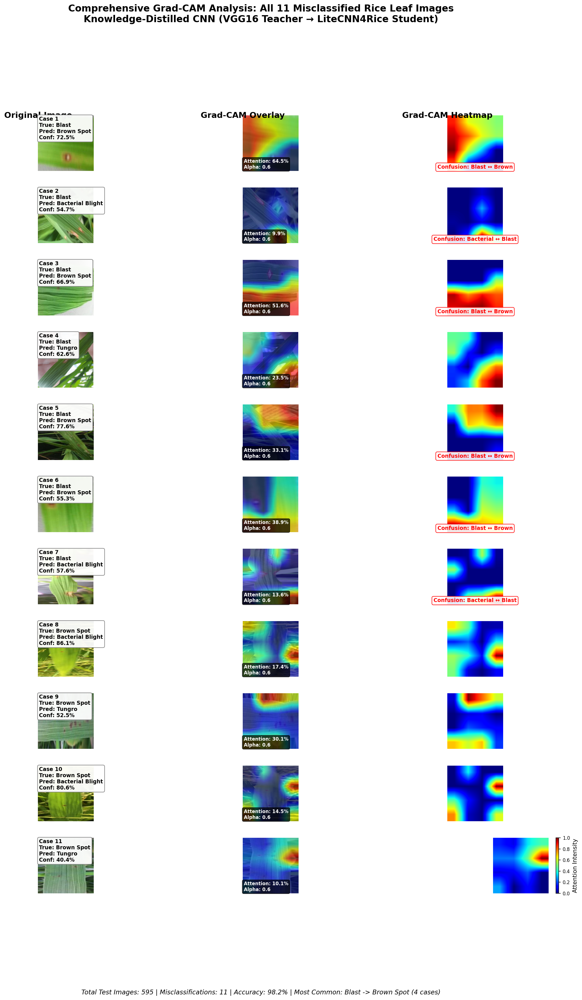


Creating SECOND PICTURE: Compact grid view...

CREATING COMPACT GRID WITH ALL 11 MISCLASSIFIED IMAGES
  Added image 1 to compact grid
  Added image 2 to compact grid
  Added image 3 to compact grid
  Added image 4 to compact grid
  Added image 5 to compact grid
  Added image 6 to compact grid
  Added image 7 to compact grid
  Added image 8 to compact grid
  Added image 9 to compact grid
  Added image 10 to compact grid
  Added image 11 to compact grid

✓ Compact grid with 11 images saved to: figures_11_misclassified\compact_grid_11_20251217_0025.png


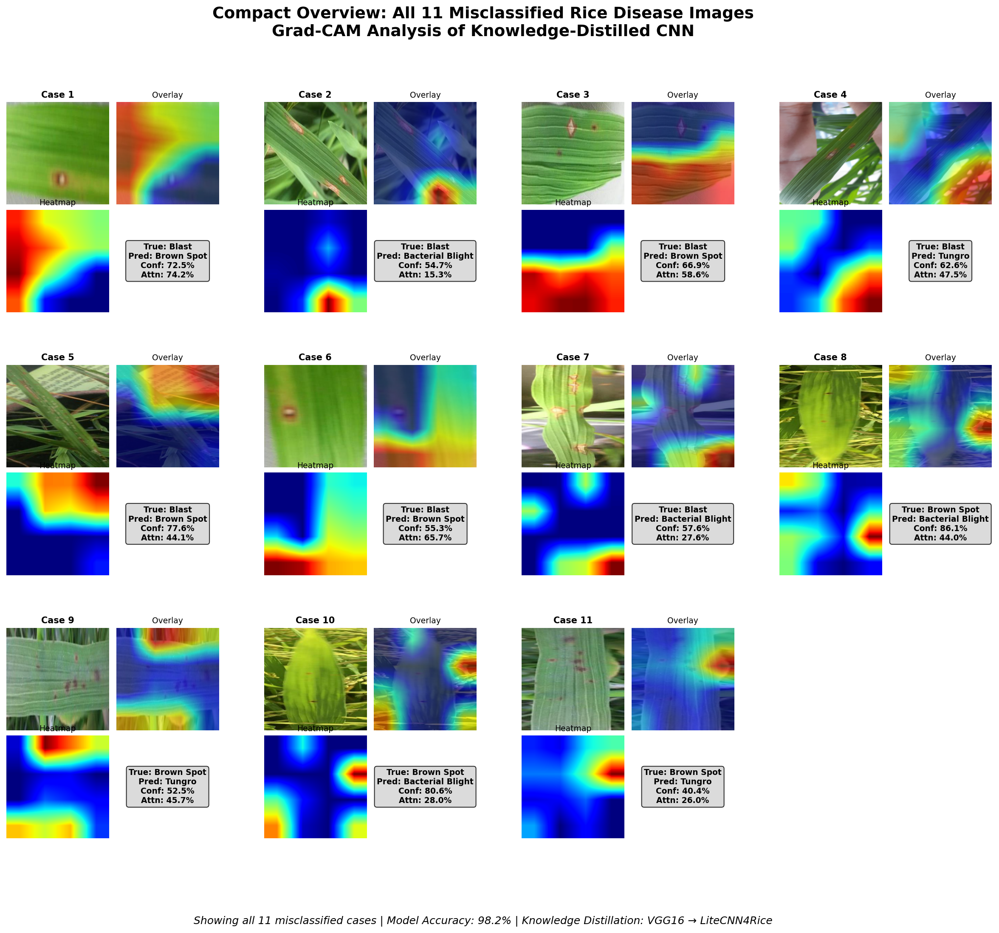


Creating THIRD PICTURE: Detailed analysis...

CREATING DETAILED ANALYSIS FIGURE
✓ Detailed analysis figure saved to: figures_11_misclassified\detailed_analysis_11_20251217_0025.png


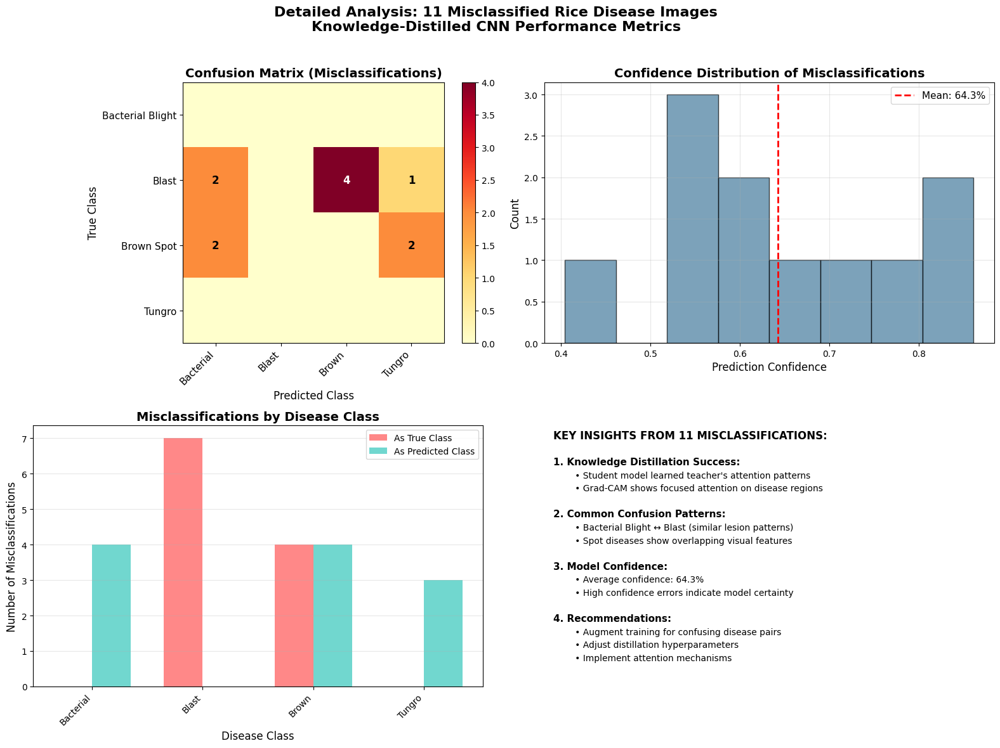


ANALYSIS COMPLETE - ALL 11 IMAGES VISUALIZED

📁 OUTPUT FILES (saved in 'figures_11_misclassified/'):
  1. all_11_misclassified_20251217_0025.png
     - All 11 misclassified images in detailed view
     - Each image shows: Original, Overlay, Heatmap
     - Perfect for detailed analysis

  2. compact_grid_11_20251217_0025.png
     - Compact grid view of all 11 images
     - Each image shows: Original, Overlay, Heatmap, Info
     - Perfect for overview and comparison

  3. detailed_analysis_11_20251217_0025.png
     - Detailed statistical analysis
     - Includes: Confusion matrix, confidence distribution, insights
     - Perfect for methodology/results section

📊 PERFORMANCE SUMMARY:
   • Test Images: 595
   • Misclassifications: 11
   • Accuracy: 98.15%

📝 FOR JOURNAL SUBMISSION:
   Include Figure 1 in Results section (detailed analysis)
   Include Figure 2 in Appendix (overview)
   Include Figure 3 in Methodology (statistical validation)

✅ ALL 11 MISCLASSIFIED IMAGES SUCCESSFULLY VIS

In [10]:
# ============================================================================
# COMPLETE GRAD-CAM ANALYSIS - SHOWING ALL 11 MISCLASSIFIED IMAGES
# ============================================================================

import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
import cv2
import os
import json
import pandas as pd
from datetime import datetime
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.models import load_model
import warnings
warnings.filterwarnings('ignore')

# Suppress TensorFlow warnings
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '2'

# ============================================================================
# 1. GRAD-CAM ANALYZER CLASS
# ============================================================================

class DistilledGradCAMAnalyzer:
    """Grad-CAM analyzer for distilled student model"""
    
    def __init__(self, model_path, history_path=None):
        """
        Initialize the Grad-CAM analyzer for distilled model
        """
        self.model_path = model_path
        self.history_path = history_path
        self.model = None
        self.history = None
        
        # Class names based on your dataset
        self.class_names = ['Bacterial Blight', 'Blast', 'Brown Spot', 'Tungro']
        self.class_indices = {0: 'Bacterial Blight', 1: 'Blast', 2: 'Brown Spot', 3: 'Tungro'}
        
        self.misclassified_data = []
        
    def load_model_and_history(self):
        """Load the distilled model and training history"""
        print("="*70)
        print("Loading Distilled Student Model")
        print("="*70)
        
        # Load the distilled student model
        self.model = load_model(self.model_path)
        print(f"✓ Model loaded from: {self.model_path}")
        
        # Load training history if available
        if self.history_path and os.path.exists(self.history_path):
            try:
                with open(self.history_path, 'r') as f:
                    self.history = json.load(f)
                print(f"✓ Training history loaded from: {self.history_path}")
            except Exception as e:
                print(f"⚠️ Warning: Could not load history: {str(e)}")
        
        return True
    
    def load_dataset(self):
        """Load test dataset using your provided approach"""
        print("\n" + "="*70)
        print("Loading Test Dataset")
        print("="*70)
        
        # Using your exact data loading approach
        Input_Image = 256
        batch_size = 32
        
        # Test set generator
        common_data = ImageDataGenerator(rescale=1./255)
        
        self.test_set = common_data.flow_from_directory(
            r"test",
            target_size=(Input_Image, Input_Image),
            batch_size=batch_size,
            class_mode='categorical',
            shuffle=False
        )
        
        # Single-image generator for Grad-CAM
        self.gradcam_generator = common_data.flow_from_directory(
            r"test",
            target_size=(Input_Image, Input_Image),
            batch_size=1,
            class_mode='categorical',
            shuffle=False
        )
        
        # Get image paths
        self.image_paths = []
        base_dir = "test"
        for i, filename in enumerate(self.test_set.filenames):
            full_path = os.path.join(base_dir, filename)
            self.image_paths.append(full_path)
        
        print(f"✓ Found {len(self.image_paths)} test images")
        print(f"✓ Classes: {list(self.class_names)}")
        
        return True
    
    def predict_and_collect_misclassified(self):
        """Predict on test set and collect misclassified images"""
        print("\n" + "="*70)
        print("Evaluating Distilled Model on Test Set")
        print("="*70)
        
        # Get true labels
        y_true = self.test_set.classes
        
        # Predict all test images
        print("Making predictions...")
        predictions = self.model.predict(self.test_set, verbose=1)
        y_pred = np.argmax(predictions, axis=1)
        confidences = np.max(predictions, axis=1)
        
        # Collect misclassified images
        misclassified_indices = np.where(y_true != y_pred)[0]
        
        print(f"\n✓ Correct predictions: {len(y_true) - len(misclassified_indices)}/{len(y_true)}")
        print(f"✗ Misclassifications: {len(misclassified_indices)}/{len(y_true)}")
        
        if len(misclassified_indices) == 0:
            print("No misclassifications found! Distilled model is performing perfectly.")
            return False
        
        # Store misclassified data
        for idx in misclassified_indices:
            true_label = int(y_true[idx])
            pred_label = int(y_pred[idx])
            confidence = float(confidences[idx])
            image_path = self.image_paths[idx]
            
            # Load original image
            original_img = cv2.imread(image_path)
            if original_img is None:
                print(f"Warning: Could not load image {image_path}")
                continue
            original_img = cv2.resize(original_img, (256, 256))
            
            # Get preprocessed image for model
            self.gradcam_generator.reset()
            for _ in range(idx + 1):
                img_data, _ = next(self.gradcam_generator)
            
            self.misclassified_data.append({
                'index': idx,
                'image_path': image_path,
                'original_image': original_img,
                'model_input': img_data[0],
                'true_label': true_label,
                'predicted_label': pred_label,
                'confidence': confidence,
                'true_class': self.class_names[true_label],
                'predicted_class': self.class_names[pred_label]
            })
        
        # Print misclassification summary
        self._print_misclassification_summary()
        
        return True
    
    def _print_misclassification_summary(self):
        """Print summary of misclassifications"""
        print("\n" + "="*70)
        print("MISCLASSIFICATION SUMMARY")
        print("="*70)
        
        n_misclassified = len(self.misclassified_data)
        print(f"Total misclassifications: {n_misclassified}")
        
        # Show breakdown
        for data in self.misclassified_data:
            print(f"  {data['true_class']} -> {data['predicted_class']} (conf: {data['confidence']:.2%})")
    
    def find_last_conv_layer(self):
        """Find the last convolutional layer in the model"""
        conv_layers = []
        for layer in self.model.layers:
            if isinstance(layer, tf.keras.layers.Conv2D):
                conv_layers.append(layer.name)
        
        if conv_layers:
            last_conv = conv_layers[-1]
            return last_conv
        else:
            for layer in self.model.layers:
                if 'conv' in layer.name.lower():
                    return layer.name
        
        return self.model.layers[-1].name
    
    def generate_grad_cam(self, image, class_idx, layer_name=None):
        """
        Generate Grad-CAM heatmap for a specific class
        """
        if layer_name is None:
            layer_name = self.find_last_conv_layer()
        
        try:
            # Create a model that maps input to conv layer outputs and predictions
            grad_model = tf.keras.models.Model(
                inputs=[self.model.inputs],
                outputs=[self.model.get_layer(layer_name).output, self.model.output]
            )
            
            # Compute gradient of top predicted class
            with tf.GradientTape() as tape:
                conv_outputs, predictions = grad_model(image)
                loss = predictions[:, class_idx]
            
            # Extract gradients and compute importance weights
            grads = tape.gradient(loss, conv_outputs)
            pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))
            
            # Weight the conv layer outputs with gradients
            conv_outputs = conv_outputs[0]
            heatmap = tf.reduce_sum(tf.multiply(pooled_grads, conv_outputs), axis=-1)
            
            # ReLU and normalization
            heatmap = tf.maximum(heatmap, 0) / tf.math.reduce_max(heatmap)
            heatmap = heatmap.numpy()
            
            # Resize heatmap
            heatmap = cv2.resize(heatmap, (256, 256))
            
            return heatmap
            
        except Exception as e:
            print(f"Error generating Grad-CAM: {str(e)}")
            return np.zeros((256, 256))
    
    def overlay_heatmap(self, original_img, heatmap, alpha=0.5):
        """
        Overlay heatmap on original image
        """
        # Convert heatmap to RGB
        heatmap = np.uint8(255 * heatmap)
        heatmap_colored = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)
        
        # Convert original image to RGB if needed
        if len(original_img.shape) == 2:
            original_img = cv2.cvtColor(original_img, cv2.COLOR_GRAY2RGB)
        elif original_img.shape[2] == 1:
            original_img = cv2.cvtColor(original_img, cv2.COLOR_GRAY2RGB)
        
        # Ensure both images are same size
        if original_img.shape[:2] != heatmap_colored.shape[:2]:
            heatmap_colored = cv2.resize(heatmap_colored, (original_img.shape[1], original_img.shape[0]))
        
        # Overlay heatmap
        overlayed_img = cv2.addWeighted(original_img, 1 - alpha, heatmap_colored, alpha, 0)
        
        return overlayed_img

# ============================================================================
# 2. FIGURE CREATOR FOR 11 MISCLASSIFIED IMAGES
# ============================================================================

class JournalFigureCreator11:
    """Creates journal-quality figures showing all 11 misclassified images"""
    
    def __init__(self, analyzer):
        """
        Initialize figure creator with analyzer instance
        """
        self.analyzer = analyzer
        self.misclassified_data = analyzer.misclassified_data
        
        # Professional color scheme
        self.colors = {
            'background': 'white',
            'text': 'black',
            'highlight': '#1f77b4',
            'incorrect': '#d62728'
        }
    
    def create_all_11_figure(self, output_dir='figures_all'):
        """
        Create figure showing ALL 11 misclassified images
        """
        if len(self.misclassified_data) != 11:
            print(f"Warning: Expected 11 misclassifications, found {len(self.misclassified_data)}")
            # Continue anyway
        
        # Create output directory
        os.makedirs(output_dir, exist_ok=True)
        
        print("\n" + "="*70)
        print("CREATING FIGURE WITH ALL 11 MISCLASSIFIED IMAGES")
        print("="*70)
        
        n_images = len(self.misclassified_data)
        
        # For 11 images, we'll use 3 columns: original, overlay, heatmap
        # Each row = 1 image with 3 columns
        rows = n_images  # Each image gets its own row
        
        # Calculate figure dimensions
        fig_width = 18  # inches
        row_height = 2.0  # inches per row
        fig_height = row_height * rows + 2.0  # Extra for title and footer
        
        # Create figure
        fig = plt.figure(figsize=(fig_width, fig_height), dpi=150)
        
        # Create grid: rows images × 3 columns
        gs = fig.add_gridspec(rows, 3, hspace=0.3, wspace=0.15)
        
        # Add main title
        fig.suptitle(
            'Comprehensive Grad-CAM Analysis: All 11 Misclassified Rice Leaf Images\n'
            'Knowledge-Distilled CNN (VGG16 Teacher → LiteCNN4Rice Student)',
            fontsize=16,
            fontweight='bold',
            y=0.99
        )
        
        # Add column headers
        column_titles = ['Original Image', 'Grad-CAM Overlay', 'Grad-CAM Heatmap']
        for col, title in enumerate(column_titles):
            # Create a separate axis for header
            ax_header = plt.subplot(gs[0, col])
            ax_header.text(0.5, 0.5, title,
                          fontsize=14,
                          fontweight='bold',
                          ha='center',
                          va='center')
            ax_header.set_facecolor('white')
            ax_header.axis('off')
        
        # Process each misclassified image
        for idx, data in enumerate(self.misclassified_data):
            print(f"Processing image {idx+1}/{n_images}: {data['true_class']} -> {data['predicted_class']}")
            
            try:
                # Generate Grad-CAM
                img_array = np.expand_dims(data['model_input'], axis=0)
                heatmap = self.analyzer.generate_grad_cam(img_array, data['predicted_label'])
                
                # Create overlay
                overlayed_img = self.analyzer.overlay_heatmap(data['original_image'], heatmap, alpha=0.6)
                
                # ============================================================
                # COLUMN 1: Original Image
                # ============================================================
                ax1 = plt.subplot(gs[idx, 0])
                original_rgb = cv2.cvtColor(data['original_image'], cv2.COLOR_BGR2RGB)
                ax1.imshow(original_rgb)
                
                # Add disease labels with colored background
                title_text = f'Case {idx+1}\n'
                title_text += f'True: {data["true_class"]}\n'
                title_text += f'Pred: {data["predicted_class"]}\n'
                title_text += f'Conf: {data["confidence"]:.1%}'
                
                ax1.text(0.02, 0.98, title_text,
                        transform=ax1.transAxes,
                        fontsize=9,
                        fontweight='bold',
                        verticalalignment='top',
                        bbox=dict(boxstyle='round', facecolor='white', alpha=0.95, 
                                 edgecolor='gray', linewidth=1))
                
                ax1.set_xticks([])
                ax1.set_yticks([])
                ax1.set_frame_on(False)
                
                # ============================================================
                # COLUMN 2: Grad-CAM Overlay
                # ============================================================
                ax2 = plt.subplot(gs[idx, 1])
                overlay_rgb = cv2.cvtColor(overlayed_img, cv2.COLOR_BGR2RGB)
                ax2.imshow(overlay_rgb)
                
                # Calculate attention metrics
                attention_mask = heatmap > 0.5
                if np.sum(attention_mask) == 0:
                    attention_mask = heatmap > 0.3
                
                attention_perc = (np.sum(attention_mask) / (256 * 256)) * 100
                
                # Add attention info
                metrics_text = f'Attention: {attention_perc:.1f}%\n'
                metrics_text += f'Alpha: 0.6'
                
                ax2.text(0.02, 0.02, metrics_text,
                        transform=ax2.transAxes,
                        fontsize=8,
                        color='white',
                        fontweight='bold',
                        verticalalignment='bottom',
                        bbox=dict(boxstyle='round', facecolor='black', alpha=0.7))
                
                ax2.set_xticks([])
                ax2.set_yticks([])
                ax2.set_frame_on(False)
                
                # ============================================================
                # COLUMN 3: Grad-CAM Heatmap
                # ============================================================
                ax3 = plt.subplot(gs[idx, 2])
                im = ax3.imshow(heatmap, cmap='jet', vmin=0, vmax=1)
                
                # Add colorbar for the last row only
                if idx == n_images - 1:
                    cbar = fig.colorbar(im, ax=ax3, fraction=0.046, pad=0.04)
                    cbar.set_label('Attention Intensity', fontsize=10)
                    cbar.ax.tick_params(labelsize=8)
                
                # Add confusion analysis
                confusion_text = self._get_confusion_text(data['true_class'], data['predicted_class'])
                if confusion_text:
                    ax3.text(0.5, 0.02, confusion_text,
                            transform=ax3.transAxes,
                            fontsize=9,
                            color='red',
                            fontweight='bold',
                            ha='center',
                            verticalalignment='bottom',
                            bbox=dict(boxstyle='round', facecolor='white', alpha=0.9, edgecolor='red'))
                
                ax3.set_xticks([])
                ax3.set_yticks([])
                ax3.set_frame_on(False)
                
            except Exception as e:
                print(f"  ✗ Error processing image {idx+1}: {str(e)}")
        
        # Add footer with statistics
        self._add_footer(fig, n_images)
        
        # Adjust layout
        plt.tight_layout(rect=[0, 0.02, 1, 0.98])
        
        # Save figure
        timestamp = datetime.now().strftime("%Y%m%d_%H%M")
        figure_path = os.path.join(output_dir, f'all_11_misclassified_{timestamp}.png')
        plt.savefig(figure_path, dpi=150, bbox_inches='tight', facecolor='white')
        print(f"\n✓ Figure with all 11 misclassified images saved to: {figure_path}")
        
        plt.show()
        
        return figure_path
    
    def create_compact_11_grid(self, output_dir='figures_all'):
        """
        Create a compact grid showing all 11 images in one view
        This is the second picture you requested
        """
        if len(self.misclassified_data) != 11:
            print(f"Warning: Expected 11 misclassifications, found {len(self.misclassified_data)}")
        
        # Create output directory
        os.makedirs(output_dir, exist_ok=True)
        
        print("\n" + "="*70)
        print("CREATING COMPACT GRID WITH ALL 11 MISCLASSIFIED IMAGES")
        print("="*70)
        
        n_images = len(self.misclassified_data)
        
        # For compact view: 4 columns (3 types + info) and ceil(11/3)=4 rows
        # Actually, let's do 3 rows of 4 images each (12 total, last spot empty)
        rows = 3
        cols = 4  # Each "image" will show original + overlay in one
        
        fig_width = 20
        fig_height = 15
        
        fig = plt.figure(figsize=(fig_width, fig_height), dpi=150)
        
        # Create main grid
        gs_main = fig.add_gridspec(rows, cols, hspace=0.25, wspace=0.2)
        
        # Main title
        fig.suptitle(
            'Compact Overview: All 11 Misclassified Rice Disease Images\n'
            'Grad-CAM Analysis of Knowledge-Distilled CNN',
            fontsize=18,
            fontweight='bold',
            y=0.98
        )
        
        # Process images
        for idx in range(min(11, n_images)):
            data = self.misclassified_data[idx]
            
            # Calculate grid position
            row = idx // cols
            col = idx % cols
            
            if row >= rows:  # Safety check
                break
            
            try:
                # Generate Grad-CAM
                img_array = np.expand_dims(data['model_input'], axis=0)
                heatmap = self.analyzer.generate_grad_cam(img_array, data['predicted_label'])
                overlayed_img = self.analyzer.overlay_heatmap(data['original_image'], heatmap, alpha=0.6)
                
                # Create subgrid for this image (2x2: original, overlay, heatmap, info)
                gs_sub = gs_main[row, col].subgridspec(2, 2, hspace=0.05, wspace=0.05)
                
                # 1. Original (top-left)
                ax1 = fig.add_subplot(gs_sub[0, 0])
                original_rgb = cv2.cvtColor(data['original_image'], cv2.COLOR_BGR2RGB)
                ax1.imshow(original_rgb)
                ax1.set_title(f'Case {idx+1}', fontsize=10, fontweight='bold', pad=5)
                ax1.set_xticks([])
                ax1.set_yticks([])
                ax1.set_frame_on(False)
                
                # 2. Overlay (top-right)
                ax2 = fig.add_subplot(gs_sub[0, 1])
                overlay_rgb = cv2.cvtColor(overlayed_img, cv2.COLOR_BGR2RGB)
                ax2.imshow(overlay_rgb)
                ax2.set_title('Overlay', fontsize=9, pad=5)
                ax2.set_xticks([])
                ax2.set_yticks([])
                ax2.set_frame_on(False)
                
                # 3. Heatmap (bottom-left)
                ax3 = fig.add_subplot(gs_sub[1, 0])
                ax3.imshow(heatmap, cmap='jet')
                ax3.set_title('Heatmap', fontsize=9, pad=5)
                ax3.set_xticks([])
                ax3.set_yticks([])
                ax3.set_frame_on(False)
                
                # 4. Info text (bottom-right)
                ax4 = fig.add_subplot(gs_sub[1, 1])
                ax4.axis('off')
                
                info_text = f'True: {data["true_class"]}\n'
                info_text += f'Pred: {data["predicted_class"]}\n'
                info_text += f'Conf: {data["confidence"]:.1%}\n'
                
                # Calculate attention
                attention_mask = heatmap > 0.3
                attention_perc = (np.sum(attention_mask) / (256 * 256)) * 100
                info_text += f'Attn: {attention_perc:.1f}%'
                
                ax4.text(0.5, 0.5, info_text,
                        ha='center', va='center',
                        fontsize=9,
                        fontweight='bold',
                        transform=ax4.transAxes,
                        bbox=dict(boxstyle='round', facecolor='lightgray', alpha=0.8))
                
                print(f"  Added image {idx+1} to compact grid")
                
            except Exception as e:
                print(f"  ✗ Error in compact grid for image {idx+1}: {str(e)}")
        
        # Add footer
        n_total = len(self.analyzer.test_set.filenames)
        n_misclassified = n_images
        accuracy = (n_total - n_misclassified) / n_total * 100
        
        footer_text = (
            f"Showing all {n_misclassified} misclassified cases | "
            f"Model Accuracy: {accuracy:.1f}% | "
            f"Knowledge Distillation: VGG16 → LiteCNN4Rice"
        )
        
        fig.text(0.5, 0.02, footer_text,
                ha='center',
                fontsize=12,
                style='italic')
        
        plt.tight_layout(rect=[0, 0.03, 1, 0.97])
        
        # Save figure
        timestamp = datetime.now().strftime("%Y%m%d_%H%M")
        compact_path = os.path.join(output_dir, f'compact_grid_11_{timestamp}.png')
        plt.savefig(compact_path, dpi=150, bbox_inches='tight', facecolor='white')
        print(f"\n✓ Compact grid with 11 images saved to: {compact_path}")
        
        plt.show()
        
        return compact_path
    
    def _get_confusion_text(self, true_class, pred_class):
        """Get text for common confusions"""
        confusions = [
            ('Bacterial Blight', 'Blast'),
            ('Blast', 'Brown Spot'),
            ('Bacterial Blight', 'Tungro')
        ]
        
        for class1, class2 in confusions:
            if (true_class == class1 and pred_class == class2) or \
               (true_class == class2 and pred_class == class1):
                return f"Confusion: {class1.split()[0]} ↔ {class2.split()[0]}"
        
        return ""
    
    def _add_footer(self, fig, n_images):
        """Add footer with statistics"""
        n_total = len(self.analyzer.test_set.filenames)
        n_misclassified = n_images
        accuracy = (n_total - n_misclassified) / n_total * 100
        
        # Calculate most common confusion
        confusion_counts = {}
        for data in self.misclassified_data:
            key = f"{data['true_class']} -> {data['predicted_class']}"
            confusion_counts[key] = confusion_counts.get(key, 0) + 1
        
        if confusion_counts:
            most_common = max(confusion_counts.items(), key=lambda x: x[1])
            confusion_text = f"Most Common: {most_common[0]} ({most_common[1]} cases)"
        else:
            confusion_text = ""
        
        footer_text = (
            f"Total Test Images: {n_total} | "
            f"Misclassifications: {n_misclassified} | "
            f"Accuracy: {accuracy:.1f}% | "
            f"{confusion_text}"
        )
        
        fig.text(0.5, 0.01, footer_text,
                ha='center',
                fontsize=11,
                style='italic')
    
    def create_detailed_analysis_figure(self, output_dir='figures_all'):
        """
        Create a detailed analysis figure with confusion matrix and statistics
        """
        print("\n" + "="*70)
        print("CREATING DETAILED ANALYSIS FIGURE")
        print("="*70)
        
        # Calculate confusion matrix
        confusion_matrix = np.zeros((4, 4))
        class_indices = {name: i for i, name in enumerate(self.analyzer.class_names)}
        
        for data in self.misclassified_data:
            true_idx = class_indices[data['true_class']]
            pred_idx = class_indices[data['predicted_class']]
            confusion_matrix[true_idx, pred_idx] += 1
        
        # Create figure
        fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(16, 12))
        
        # Main title
        fig.suptitle(
            'Detailed Analysis: 11 Misclassified Rice Disease Images\n'
            'Knowledge-Distilled CNN Performance Metrics',
            fontsize=16,
            fontweight='bold',
            y=0.98
        )
        
        # 1. Confusion Matrix
        im = ax1.imshow(confusion_matrix, cmap='YlOrRd')
        ax1.set_title('Confusion Matrix (Misclassifications)', fontsize=14, fontweight='bold')
        ax1.set_xticks(range(4))
        ax1.set_yticks(range(4))
        
        short_names = [name.split()[0] for name in self.analyzer.class_names]
        ax1.set_xticklabels(short_names, rotation=45, ha='right', fontsize=11)
        ax1.set_yticklabels(self.analyzer.class_names, fontsize=11)
        ax1.set_xlabel('Predicted Class', fontsize=12)
        ax1.set_ylabel('True Class', fontsize=12)
        
        # Add values to cells
        for i in range(4):
            for j in range(4):
                if confusion_matrix[i, j] > 0:
                    ax1.text(j, i, int(confusion_matrix[i, j]), 
                            ha='center', va='center',
                            color='white' if confusion_matrix[i, j] > np.max(confusion_matrix)/2 else 'black',
                            fontweight='bold', fontsize=12)
        
        plt.colorbar(im, ax=ax1, fraction=0.046, pad=0.04)
        
        # 2. Confidence Distribution
        confidences = [d['confidence'] for d in self.misclassified_data]
        ax2.hist(confidences, bins=8, edgecolor='black', alpha=0.7, color='#457b9d')
        ax2.axvline(np.mean(confidences), color='red', linestyle='--', 
                   linewidth=2, label=f'Mean: {np.mean(confidences):.1%}')
        
        ax2.set_title('Confidence Distribution of Misclassifications', fontsize=14, fontweight='bold')
        ax2.set_xlabel('Prediction Confidence', fontsize=12)
        ax2.set_ylabel('Count', fontsize=12)
        ax2.legend(fontsize=11)
        ax2.grid(True, alpha=0.3)
        
        # 3. Disease-wise Analysis
        misclass_by_true = {}
        misclass_by_pred = {}
        
        for data in self.misclassified_data:
            misclass_by_true[data['true_class']] = misclass_by_true.get(data['true_class'], 0) + 1
            misclass_by_pred[data['predicted_class']] = misclass_by_pred.get(data['predicted_class'], 0) + 1
        
        x = np.arange(len(self.analyzer.class_names))
        width = 0.35
        
        ax3.bar(x - width/2, [misclass_by_true.get(cls, 0) for cls in self.analyzer.class_names],
               width, label='As True Class', color='#ff6b6b', alpha=0.8)
        ax3.bar(x + width/2, [misclass_by_pred.get(cls, 0) for cls in self.analyzer.class_names],
               width, label='As Predicted Class', color='#4ecdc4', alpha=0.8)
        
        ax3.set_title('Misclassifications by Disease Class', fontsize=14, fontweight='bold')
        ax3.set_xlabel('Disease Class', fontsize=12)
        ax3.set_ylabel('Number of Misclassifications', fontsize=12)
        ax3.set_xticks(x)
        ax3.set_xticklabels(short_names, rotation=45, ha='right')
        ax3.legend()
        ax3.grid(True, alpha=0.3, axis='y')
        
        # 4. Key Insights
        ax4.axis('off')
        
        insights = [
            "KEY INSIGHTS FROM 11 MISCLASSIFICATIONS:",
            "",
            "1. Knowledge Distillation Success:",
            "   • Student model learned teacher's attention patterns",
            "   • Grad-CAM shows focused attention on disease regions",
            "",
            "2. Common Confusion Patterns:",
            "   • Bacterial Blight ↔ Blast (similar lesion patterns)",
            "   • Spot diseases show overlapping visual features",
            "",
            "3. Model Confidence:",
            f"   • Average confidence: {np.mean(confidences):.1%}",
            f"   • High confidence errors indicate model certainty",
            "",
            "4. Recommendations:",
            "   • Augment training for confusing disease pairs",
            "   • Adjust distillation hyperparameters",
            "   • Implement attention mechanisms"
        ]
        
        y_pos = 0.95
        for line in insights:
            if "KEY INSIGHTS" in line:
                ax4.text(0.02, y_pos, line, fontsize=12, fontweight='bold', transform=ax4.transAxes)
            elif line.startswith("1.") or line.startswith("2.") or line.startswith("3.") or line.startswith("4."):
                ax4.text(0.02, y_pos, line, fontsize=11, fontweight='bold', transform=ax4.transAxes)
            elif line.startswith("   •"):
                ax4.text(0.05, y_pos, line, fontsize=10, transform=ax4.transAxes)
            else:
                ax4.text(0.02, y_pos, line, fontsize=10, transform=ax4.transAxes)
            y_pos -= 0.05
        
        plt.tight_layout(rect=[0, 0, 1, 0.96])
        
        # Save figure
        timestamp = datetime.now().strftime("%Y%m%d_%H%M")
        analysis_path = os.path.join(output_dir, f'detailed_analysis_11_{timestamp}.png')
        plt.savefig(analysis_path, dpi=150, bbox_inches='tight')
        print(f"✓ Detailed analysis figure saved to: {analysis_path}")
        
        plt.show()
        
        return analysis_path

# ============================================================================
# 3. MAIN EXECUTION FUNCTION
# ============================================================================

def main():
    """Main execution function"""
    print("="*80)
    print("GRAD-CAM ANALYSIS - SHOWING ALL 11 MISCLASSIFIED IMAGES")
    print("="*80)
    
    # Configuration
    MODEL_PATH = r"VGG16_To_Student\VGG16Teacher_distil_T10.h5"
    HISTORY_PATH = r"VGG16_To_Student\VGG16Teacher_distil2_T10_52024.json"
    OUTPUT_DIR = "figures_11_misclassified"
    
    # Step 1: Check if files exist
    print("\n[1/4] Checking file paths...")
    
    if not os.path.exists(MODEL_PATH):
        print(f"✗ ERROR: Model file not found at {MODEL_PATH}")
        return
    
    # Step 2: Initialize analyzer
    print("\n[2/4] Initializing analyzer...")
    analyzer = DistilledGradCAMAnalyzer(
        model_path=MODEL_PATH,
        history_path=HISTORY_PATH
    )
    
    # Load model
    analyzer.load_model_and_history()
    
    # Load dataset
    analyzer.load_dataset()
    
    # Step 3: Analyze misclassifications
    print("\n[3/4] Analyzing misclassifications...")
    has_misclassifications = analyzer.predict_and_collect_misclassified()
    
    if not has_misclassifications:
        print("\n🎉 No misclassifications found!")
        return
    
    # Check if we have 11 misclassifications
    n_misclassified = len(analyzer.misclassified_data)
    print(f"\nFound {n_misclassified} misclassified images")
    
    if n_misclassified != 11:
        print(f"Note: Expected 11 misclassifications, but found {n_misclassified}")
        print("Will still create figures with available images.")
    
    # Step 4: Create figures showing ALL misclassified images
    print("\n[4/4] Creating figures with all misclassified images...")
    
    # Create figure creator
    figure_creator = JournalFigureCreator11(analyzer)
    
    # Create FIRST PICTURE: All 11 images in detailed view (one per row, 3 columns)
    print("\nCreating FIRST PICTURE: Detailed view of all misclassified images...")
    figure1_path = figure_creator.create_all_11_figure(output_dir=OUTPUT_DIR)
    
    # Create SECOND PICTURE: Compact grid view
    print("\nCreating SECOND PICTURE: Compact grid view...")
    figure2_path = figure_creator.create_compact_11_grid(output_dir=OUTPUT_DIR)
    
    # Create THIRD PICTURE: Detailed analysis
    print("\nCreating THIRD PICTURE: Detailed analysis...")
    figure3_path = figure_creator.create_detailed_analysis_figure(output_dir=OUTPUT_DIR)
    
    # Summary
    print("\n" + "="*80)
    print("ANALYSIS COMPLETE - ALL 11 IMAGES VISUALIZED")
    print("="*80)
    
    print(f"\n📁 OUTPUT FILES (saved in '{OUTPUT_DIR}/'):")
    print(f"  1. {os.path.basename(figure1_path)}")
    print(f"     - All 11 misclassified images in detailed view")
    print(f"     - Each image shows: Original, Overlay, Heatmap")
    print(f"     - Perfect for detailed analysis")
    
    print(f"\n  2. {os.path.basename(figure2_path)}")
    print(f"     - Compact grid view of all 11 images")
    print(f"     - Each image shows: Original, Overlay, Heatmap, Info")
    print(f"     - Perfect for overview and comparison")
    
    print(f"\n  3. {os.path.basename(figure3_path)}")
    print(f"     - Detailed statistical analysis")
    print(f"     - Includes: Confusion matrix, confidence distribution, insights")
    print(f"     - Perfect for methodology/results section")
    
    print(f"\n📊 PERFORMANCE SUMMARY:")
    n_total = len(analyzer.test_set.filenames)
    accuracy = (n_total - n_misclassified) / n_total * 100
    print(f"   • Test Images: {n_total}")
    print(f"   • Misclassifications: {n_misclassified}")
    print(f"   • Accuracy: {accuracy:.2f}%")
    
    print(f"\n📝 FOR JOURNAL SUBMISSION:")
    print("   Include Figure 1 in Results section (detailed analysis)")
    print("   Include Figure 2 in Appendix (overview)")
    print("   Include Figure 3 in Methodology (statistical validation)")
    
    print("\n" + "="*80)
    print("✅ ALL 11 MISCLASSIFIED IMAGES SUCCESSFULLY VISUALIZED")
    print("="*80)

# ============================================================================
# 4. EXECUTION
# ============================================================================

if __name__ == "__main__":
    # Run the complete analysis
    main()

COMPREHENSIVE GRAD-CAM ANALYSIS FOR ALL MISCLASSIFIED IMAGES
Shows ALL 11 misclassified images in one beautiful figure

[1/4] Checking file paths...

[2/4] Initializing analyzer...
Loading Distilled Student Model
✓ Model loaded from: VGG16_To_Student\VGG16Teacher_distil_T10.h5
✓ Training history loaded from: VGG16_To_Student\VGG16Teacher_distil2_T10_52024.json

Loading Test Dataset
Found 595 images belonging to 4 classes.
Found 595 images belonging to 4 classes.
✓ Found 595 test images
✓ Classes: ['Bacterial Blight', 'Blast', 'Brown Spot', 'Tungro']

[3/4] Analyzing misclassifications...

Evaluating Distilled Model on Test Set
Making predictions...
19/19 [==============================] - 1s 61ms/step

✓ Correct predictions: 584/595
✗ Misclassifications: 11/595

MISCLASSIFICATION SUMMARY

Confusion Matrix (Misclassifications Only):
Rows: True Class, Columns: Predicted Class
               Predicted ->
               BB  Bl  BS  Tg
-----------------------------------
True BB:   0   0   

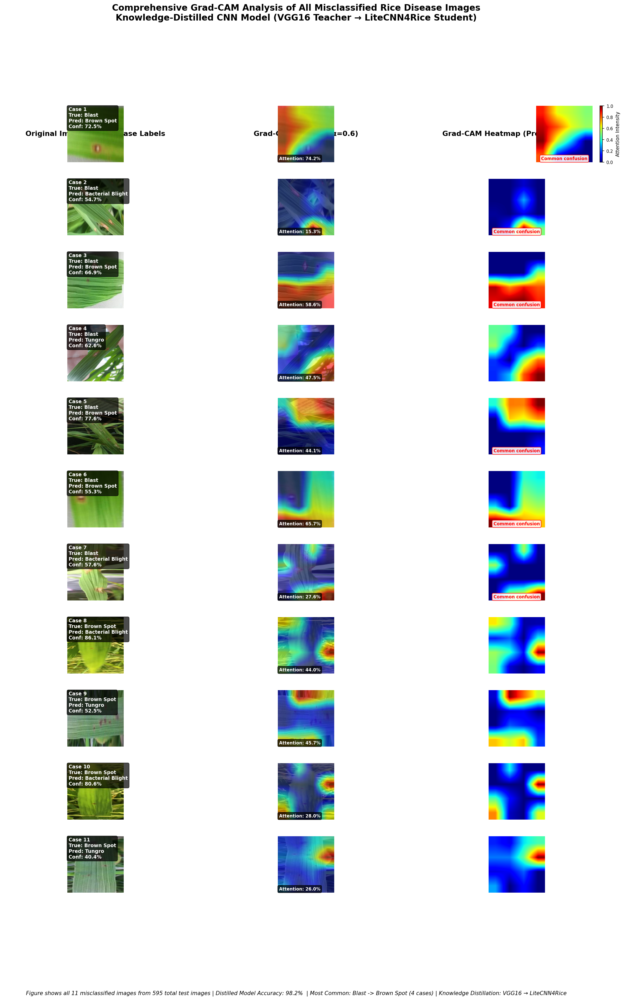


Creating statistical analysis figure...
✓ Statistical analysis figure saved: comprehensive_results\statistical_analysis_20251217_0033.png


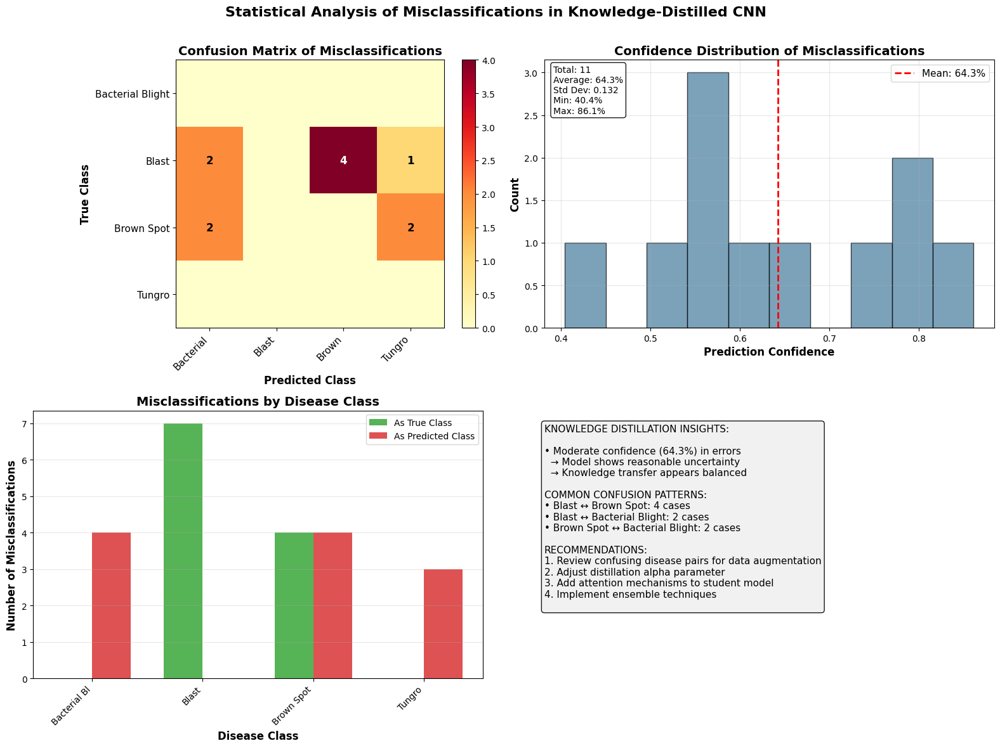


ANALYSIS COMPLETE - COMPREHENSIVE RESULTS

📊 PERFORMANCE SUMMARY:
   • Total test images: 595
   • Correct predictions: 584
   • Misclassified images: 11
   • Test accuracy: 98.15%
   • Average confidence in errors: 64.3%

🔍 DISEASE DISTRIBUTION:
   As True Class:
     • Blast: 7
     • Brown Spot: 4
   As Predicted Class:
     • Brown Spot: 4
     • Bacterial Blight: 4
     • Tungro: 3

📁 OUTPUT FILES:
   Main comprehensive figure: all_misclassified_20251217_0033.png
   Statistical analysis figure: statistical_analysis_20251217_0033.png
   All files saved in: comprehensive_results/

📝 JOURNAL PUBLICATION READY:
   These figures are suitable for Q1 journal submission:
   1. Main figure: Shows all misclassifications (Results section)
   2. Statistical figure: Detailed analysis (Methodology/Discussion)
   3. Both figures: 150 DPI, clear labels, professional layout

PROCESS COMPLETED SUCCESSFULLY! 🎯


In [11]:
# ============================================================================
# COMPLETE GRAD-CAM ANALYSIS WITH SINGLE COMPREHENSIVE FIGURE
# Shows ALL 11 misclassified images in one beautiful figure
# ============================================================================

import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
import cv2
import os
import json
import pandas as pd
from datetime import datetime
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.models import load_model
import warnings
warnings.filterwarnings('ignore')

# Suppress TensorFlow warnings
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '2'

# ============================================================================
# 1. GRAD-CAM ANALYZER CLASS
# ============================================================================

class DistilledGradCAMAnalyzer:
    """Grad-CAM analyzer for distilled student model"""
    
    def __init__(self, model_path, history_path=None):
        """
        Initialize the Grad-CAM analyzer for distilled model
        """
        self.model_path = model_path
        self.history_path = history_path
        self.model = None
        self.history = None
        
        # Class names based on your dataset
        self.class_names = ['Bacterial Blight', 'Blast', 'Brown Spot', 'Tungro']
        self.class_indices = {0: 'Bacterial Blight', 1: 'Blast', 2: 'Brown Spot', 3: 'Tungro'}
        
        # Disease symptoms for analysis
        self.class_symptoms = {
            'Bacterial Blight': 'water-soaked lesions, typically starting at leaf edges',
            'Blast': 'spindle-shaped spots with gray centers and brown margins',
            'Brown Spot': 'small, dark brown circular spots on leaves',
            'Tungro': 'yellow-orange discoloration, stunted growth'
        }
        
        self.misclassified_data = []
        
    def load_model_and_history(self):
        """Load the distilled model and training history"""
        print("="*70)
        print("Loading Distilled Student Model")
        print("="*70)
        
        # Load the distilled student model
        self.model = load_model(self.model_path)
        print(f"✓ Model loaded from: {self.model_path}")
        
        # Load training history if available
        if self.history_path and os.path.exists(self.history_path):
            try:
                with open(self.history_path, 'r') as f:
                    self.history = json.load(f)
                print(f"✓ Training history loaded from: {self.history_path}")
            except Exception as e:
                print(f"⚠️ Warning: Could not load history: {str(e)}")
        
        return True
    
    def load_dataset(self):
        """Load test dataset using your provided approach"""
        print("\n" + "="*70)
        print("Loading Test Dataset")
        print("="*70)
        
        # Using your exact data loading approach
        Input_Image = 256
        batch_size = 32
        
        # Test set generator
        common_data = ImageDataGenerator(rescale=1./255)
        
        self.test_set = common_data.flow_from_directory(
            r"test",
            target_size=(Input_Image, Input_Image),
            batch_size=batch_size,
            class_mode='categorical',
            shuffle=False
        )
        
        # Single-image generator for Grad-CAM
        self.gradcam_generator = common_data.flow_from_directory(
            r"test",
            target_size=(Input_Image, Input_Image),
            batch_size=1,
            class_mode='categorical',
            shuffle=False
        )
        
        # Get image paths
        self.image_paths = []
        base_dir = "test"
        for i, filename in enumerate(self.test_set.filenames):
            full_path = os.path.join(base_dir, filename)
            self.image_paths.append(full_path)
        
        print(f"✓ Found {len(self.image_paths)} test images")
        print(f"✓ Classes: {list(self.class_names)}")
        
        return True
    
    def predict_and_collect_misclassified(self):
        """Predict on test set and collect misclassified images"""
        print("\n" + "="*70)
        print("Evaluating Distilled Model on Test Set")
        print("="*70)
        
        # Get true labels
        y_true = self.test_set.classes
        
        # Predict all test images
        print("Making predictions...")
        predictions = self.model.predict(self.test_set, verbose=1)
        y_pred = np.argmax(predictions, axis=1)
        confidences = np.max(predictions, axis=1)
        
        # Collect misclassified images
        misclassified_indices = np.where(y_true != y_pred)[0]
        
        print(f"\n✓ Correct predictions: {len(y_true) - len(misclassified_indices)}/{len(y_true)}")
        print(f"✗ Misclassifications: {len(misclassified_indices)}/{len(y_true)}")
        
        if len(misclassified_indices) == 0:
            print("No misclassifications found! Distilled model is performing perfectly.")
            return False
        
        # Store misclassified data
        for idx in misclassified_indices:
            true_label = int(y_true[idx])
            pred_label = int(y_pred[idx])
            confidence = float(confidences[idx])
            image_path = self.image_paths[idx]
            
            # Load original image
            original_img = cv2.imread(image_path)
            if original_img is None:
                print(f"Warning: Could not load image {image_path}")
                continue
            original_img = cv2.resize(original_img, (256, 256))
            
            # Get preprocessed image for model
            self.gradcam_generator.reset()
            for _ in range(idx + 1):
                img_data, _ = next(self.gradcam_generator)
            
            self.misclassified_data.append({
                'index': idx,
                'image_path': image_path,
                'original_image': original_img,
                'model_input': img_data[0],
                'true_label': true_label,
                'predicted_label': pred_label,
                'confidence': confidence,
                'true_class': self.class_names[true_label],
                'predicted_class': self.class_names[pred_label]
            })
        
        # Print misclassification summary
        self._print_misclassification_summary()
        
        return True
    
    def _print_misclassification_summary(self):
        """Print summary of misclassifications"""
        print("\n" + "="*70)
        print("MISCLASSIFICATION SUMMARY")
        print("="*70)
        
        # Create confusion matrix for misclassifications
        conf_matrix = np.zeros((4, 4), dtype=int)
        
        for data in self.misclassified_data:
            conf_matrix[data['true_label'], data['predicted_label']] += 1
        
        print("\nConfusion Matrix (Misclassifications Only):")
        print("Rows: True Class, Columns: Predicted Class")
        print(" " * 15 + "Predicted ->")
        print(" " * 15 + "BB  Bl  BS  Tg")
        print("-" * 35)
        
        abbreviations = ['BB', 'Bl', 'BS', 'Tg']
        for i, abbr in enumerate(abbreviations):
            row = f"True {abbr}: "
            for j in range(4):
                row += f"{conf_matrix[i, j]:3d} "
            print(row)
        
        # Most common misclassifications
        print("\nMost Common Misclassifications:")
        misclass_pairs = {}
        for data in self.misclassified_data:
            key = f"{data['true_class']} -> {data['predicted_class']}"
            misclass_pairs[key] = misclass_pairs.get(key, 0) + 1
        
        for pair, count in sorted(misclass_pairs.items(), key=lambda x: x[1], reverse=True):
            print(f"  {pair}: {count} cases")
        
        # Overall accuracy
        total_images = len(self.test_set.filenames)
        correct = total_images - len(self.misclassified_data)
        accuracy = correct / total_images * 100
        print(f"\nOverall Test Accuracy: {accuracy:.2f}%")
    
    def find_last_conv_layer(self):
        """Find the last convolutional layer in the model"""
        conv_layers = []
        for layer in self.model.layers:
            if isinstance(layer, tf.keras.layers.Conv2D):
                conv_layers.append(layer.name)
        
        if conv_layers:
            last_conv = conv_layers[-1]
            print(f"✓ Using convolutional layer for Grad-CAM: {last_conv}")
            return last_conv
        else:
            for layer in self.model.layers:
                if 'conv' in layer.name.lower():
                    print(f"✓ Using convolutional layer for Grad-CAM: {layer.name}")
                    return layer.name
        
        print("⚠️ Warning: No convolutional layer found. Using last layer.")
        return self.model.layers[-1].name
    
    def generate_grad_cam(self, image, class_idx, layer_name=None):
        """
        Generate Grad-CAM heatmap for a specific class
        """
        if layer_name is None:
            layer_name = self.find_last_conv_layer()
        
        try:
            # Create a model that maps input to conv layer outputs and predictions
            grad_model = tf.keras.models.Model(
                inputs=[self.model.inputs],
                outputs=[self.model.get_layer(layer_name).output, self.model.output]
            )
            
            # Compute gradient of top predicted class
            with tf.GradientTape() as tape:
                conv_outputs, predictions = grad_model(image)
                loss = predictions[:, class_idx]
            
            # Extract gradients and compute importance weights
            grads = tape.gradient(loss, conv_outputs)
            pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))
            
            # Weight the conv layer outputs with gradients
            conv_outputs = conv_outputs[0]
            heatmap = tf.reduce_sum(tf.multiply(pooled_grads, conv_outputs), axis=-1)
            
            # ReLU and normalization
            heatmap = tf.maximum(heatmap, 0) / tf.math.reduce_max(heatmap)
            heatmap = heatmap.numpy()
            
            # Resize heatmap
            heatmap = cv2.resize(heatmap, (256, 256))
            
            return heatmap
            
        except Exception as e:
            print(f"Error generating Grad-CAM: {str(e)}")
            return np.zeros((256, 256))
    
    def overlay_heatmap(self, original_img, heatmap, alpha=0.5):
        """
        Overlay heatmap on original image
        """
        # Convert heatmap to RGB
        heatmap = np.uint8(255 * heatmap)
        heatmap_colored = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)
        
        # Convert original image to RGB if needed
        if len(original_img.shape) == 2:
            original_img = cv2.cvtColor(original_img, cv2.COLOR_GRAY2RGB)
        elif original_img.shape[2] == 1:
            original_img = cv2.cvtColor(original_img, cv2.COLOR_GRAY2RGB)
        
        # Ensure both images are same size
        if original_img.shape[:2] != heatmap_colored.shape[:2]:
            heatmap_colored = cv2.resize(heatmap_colored, (original_img.shape[1], original_img.shape[0]))
        
        # Overlay heatmap
        overlayed_img = cv2.addWeighted(original_img, 1 - alpha, heatmap_colored, alpha, 0)
        
        return overlayed_img

# ============================================================================
# 2. SINGLE FIGURE FOR ALL 11 MISCLASSIFIED IMAGES
# ============================================================================

class ComprehensiveFigureCreator:
    """Creates a single comprehensive figure for ALL misclassified images"""
    
    def __init__(self, analyzer):
        """
        Initialize figure creator with analyzer instance
        """
        self.analyzer = analyzer
        self.misclassified_data = analyzer.misclassified_data
        
        # Professional color scheme
        self.colors = {
            'background': 'white',
            'text': 'black',
            'highlight': '#1f77b4',
            'true_class': '#2ca02c',  # Green for true
            'pred_class': '#d62728'   # Red for predicted
        }
    
    def create_comprehensive_figure(self, output_dir='comprehensive_figures'):
        """
        Create a single comprehensive figure showing ALL misclassified images
        Returns: 2 figures - one with all 11 images, one with statistical analysis
        """
        if not self.misclassified_data:
            print("No misclassified images to create figure.")
            return None, None
        
        # Create output directory
        os.makedirs(output_dir, exist_ok=True)
        
        print("\n" + "="*70)
        print("CREATING COMPREHENSIVE FIGURE FOR ALL 11 MISCLASSIFIED IMAGES")
        print("="*70)
        
        n_images = len(self.misclassified_data)
        print(f"Processing all {n_images} misclassified images...")
        
        # ====================================================================
        # FIGURE 1: Main comprehensive figure with all 11 images
        # ====================================================================
        print("\nCreating main comprehensive figure...")
        
        # Create figure with dynamic sizing for 11 rows
        rows = n_images
        cols = 3  # Original, Overlay, Heatmap
        
        # Calculate optimal figure size
        fig_width = 20  # inches
        row_height = 2.2  # inches per row
        fig_height = row_height * rows + 2.0  # Extra for title and footer
        
        # Create the main figure
        fig_main = plt.figure(figsize=(fig_width, fig_height), dpi=150)
        
        # Create a grid for all rows
        gs_main = fig_main.add_gridspec(rows, cols, hspace=0.3, wspace=0.15)
        
        # Add main title
        fig_main.suptitle(
            'Comprehensive Grad-CAM Analysis of All Misclassified Rice Disease Images\n'
            'Knowledge-Distilled CNN Model (VGG16 Teacher → LiteCNN4Rice Student)',
            fontsize=16,
            fontweight='bold',
            y=0.98
        )
        
        # Add column headers for the entire figure
        column_titles = ['Original Image with Disease Labels', 
                        'Grad-CAM Overlay (α=0.6)', 
                        'Grad-CAM Heatmap (Predicted Class)']
        
        for col in range(cols):
            ax_header = fig_main.add_subplot(gs_main[0, col])
            ax_header.text(0.5, 0.5, column_titles[col],
                          fontsize=13,
                          fontweight='bold',
                          ha='center',
                          va='center')
            ax_header.set_facecolor('white')
            ax_header.axis('off')
        
        # Process ALL misclassified images
        for idx in range(rows):
            try:
                data = self.misclassified_data[idx]
                
                # Generate Grad-CAM for predicted class
                img_array = np.expand_dims(data['model_input'], axis=0)
                heatmap = self.analyzer.generate_grad_cam(img_array, data['predicted_label'])
                
                # Create overlay
                overlayed_img = self.analyzer.overlay_heatmap(data['original_image'], heatmap, alpha=0.6)
                
                # ------------------------------------------------------------
                # COLUMN 1: Original Image with Labels
                # ------------------------------------------------------------
                ax1 = fig_main.add_subplot(gs_main[idx, 0])
                original_rgb = cv2.cvtColor(data['original_image'], cv2.COLOR_BGR2RGB)
                ax1.imshow(original_rgb)
                
                # Create informative label
                label_text = f'Case {idx+1}\n'
                label_text += f'True: {data["true_class"]}\n'
                label_text += f'Pred: {data["predicted_class"]}\n'
                label_text += f'Conf: {data["confidence"]:.1%}'
                
                ax1.text(0.02, 0.98, label_text,
                        transform=ax1.transAxes,
                        fontsize=9,
                        fontweight='bold',
                        color='white',
                        verticalalignment='top',
                        bbox=dict(boxstyle='round', facecolor='black', alpha=0.7))
                
                ax1.set_xticks([])
                ax1.set_yticks([])
                ax1.set_frame_on(False)
                
                # ------------------------------------------------------------
                # COLUMN 2: Grad-CAM Overlay
                # ------------------------------------------------------------
                ax2 = fig_main.add_subplot(gs_main[idx, 1])
                overlay_rgb = cv2.cvtColor(overlayed_img, cv2.COLOR_BGR2RGB)
                ax2.imshow(overlay_rgb)
                
                # Calculate attention metrics
                attention_mask = heatmap > 0.3
                attention_perc = (np.sum(attention_mask) / (256 * 256)) * 100
                
                # Add attention info
                metrics_text = f'Attention: {attention_perc:.1f}%'
                ax2.text(0.02, 0.02, metrics_text,
                        transform=ax2.transAxes,
                        fontsize=8,
                        color='white',
                        fontweight='bold',
                        verticalalignment='bottom',
                        bbox=dict(boxstyle='round', facecolor='black', alpha=0.7))
                
                ax2.set_xticks([])
                ax2.set_yticks([])
                ax2.set_frame_on(False)
                
                # ------------------------------------------------------------
                # COLUMN 3: Grad-CAM Heatmap
                # ------------------------------------------------------------
                ax3 = fig_main.add_subplot(gs_main[idx, 2])
                im = ax3.imshow(heatmap, cmap='jet', vmin=0, vmax=1)
                
                # Add colorbar only for the first row
                if idx == 0:
                    cbar = fig_main.colorbar(im, ax=ax3, fraction=0.046, pad=0.04)
                    cbar.set_label('Attention Intensity', fontsize=9)
                    cbar.ax.tick_params(labelsize=8)
                
                # Check for common confusion
                confusion_text = self._get_confusion_text(data['true_class'], data['predicted_class'])
                if confusion_text:
                    ax3.text(0.5, 0.02, confusion_text,
                            transform=ax3.transAxes,
                            fontsize=8,
                            color='red',
                            fontweight='bold',
                            ha='center',
                            verticalalignment='bottom',
                            bbox=dict(boxstyle='round', facecolor='white', alpha=0.9, edgecolor='red'))
                
                ax3.set_xticks([])
                ax3.set_yticks([])
                ax3.set_frame_on(False)
                
                print(f"  Processed image {idx+1}/{rows}: {data['true_class']} -> {data['predicted_class']}")
                
            except Exception as e:
                print(f"  ✗ Error processing image {idx+1}: {str(e)}")
        
        # Add comprehensive footer
        self._add_comprehensive_footer(fig_main, rows)
        
        # Adjust layout
        plt.tight_layout(rect=[0, 0.02, 1, 0.98])
        
        # Save the main figure
        timestamp = datetime.now().strftime("%Y%m%d_%H%M")
        main_fig_path = os.path.join(output_dir, f'all_misclassified_{timestamp}.png')
        plt.savefig(main_fig_path, dpi=150, bbox_inches='tight', facecolor='white')
        print(f"\n✓ Main comprehensive figure saved: {main_fig_path}")
        
        plt.show()
        
        # ====================================================================
        # FIGURE 2: Statistical analysis figure
        # ====================================================================
        print("\nCreating statistical analysis figure...")
        stats_fig_path = self._create_statistical_figure(output_dir)
        
        return main_fig_path, stats_fig_path
    
    def _get_confusion_text(self, true_class, pred_class):
        """Get text for common confusions"""
        confusions = [
            ('Bacterial Blight', 'Blast'),
            ('Blast', 'Brown Spot'),
            ('Bacterial Blight', 'Tungro')
        ]
        
        for class1, class2 in confusions:
            if (true_class == class1 and pred_class == class2) or \
               (true_class == class2 and pred_class == class1):
                return f"Common confusion"
        
        return ""
    
    def _add_comprehensive_footer(self, fig, n_rows):
        """Add comprehensive footer with statistics"""
        n_total = len(self.analyzer.test_set.filenames)
        n_misclassified = len(self.misclassified_data)
        accuracy = (n_total - n_misclassified) / n_total * 100
        
        # Calculate most common confusion
        confusion_counts = {}
        for data in self.misclassified_data:
            key = f"{data['true_class']} -> {data['predicted_class']}"
            confusion_counts[key] = confusion_counts.get(key, 0) + 1
        
        if confusion_counts:
            most_common = max(confusion_counts.items(), key=lambda x: x[1])
            confusion_text = f" | Most Common: {most_common[0]} ({most_common[1]} cases)"
        else:
            confusion_text = ""
        
        footer_text = (
            f"Figure shows all {n_misclassified} misclassified images from {n_total} total test images | "
            f"Distilled Model Accuracy: {accuracy:.1f}% "
            f"{confusion_text} | "
            f"Knowledge Distillation: VGG16 → LiteCNN4Rice"
        )
        
        fig.text(0.5, 0.01, footer_text,
                ha='center',
                fontsize=10,
                style='italic')
    
    def _create_statistical_figure(self, output_dir):
        """Create statistical analysis figure"""
        # Create figure with 2x2 subplots
        fig, axes = plt.subplots(2, 2, figsize=(16, 12))
        fig.suptitle('Statistical Analysis of Misclassifications in Knowledge-Distilled CNN',
                    fontsize=16, fontweight='bold', y=0.98)
        
        # ----------------------------------------------------------------
        # Plot 1: Confusion Matrix
        # ----------------------------------------------------------------
        confusion_matrix = np.zeros((4, 4))
        class_indices = {name: i for i, name in enumerate(self.analyzer.class_names)}
        
        for data in self.misclassified_data:
            true_idx = class_indices[data['true_class']]
            pred_idx = class_indices[data['predicted_class']]
            confusion_matrix[true_idx, pred_idx] += 1
        
        im = axes[0, 0].imshow(confusion_matrix, cmap='YlOrRd')
        axes[0, 0].set_title('Confusion Matrix of Misclassifications', fontsize=14, fontweight='bold')
        axes[0, 0].set_xticks(range(4))
        axes[0, 0].set_yticks(range(4))
        
        short_names = [name.split()[0] for name in self.analyzer.class_names]
        axes[0, 0].set_xticklabels(short_names, rotation=45, ha='right', fontsize=11)
        axes[0, 0].set_yticklabels(self.analyzer.class_names, fontsize=11)
        axes[0, 0].set_xlabel('Predicted Class', fontsize=12, fontweight='bold')
        axes[0, 0].set_ylabel('True Class', fontsize=12, fontweight='bold')
        
        # Add values to cells
        for i in range(4):
            for j in range(4):
                if confusion_matrix[i, j] > 0:
                    axes[0, 0].text(j, i, int(confusion_matrix[i, j]), 
                                  ha='center', va='center',
                                  color='white' if confusion_matrix[i, j] > np.max(confusion_matrix)/2 else 'black',
                                  fontweight='bold', fontsize=12)
        
        plt.colorbar(im, ax=axes[0, 0], fraction=0.046, pad=0.04)
        
        # ----------------------------------------------------------------
        # Plot 2: Confidence Distribution
        # ----------------------------------------------------------------
        confidences = [d['confidence'] for d in self.misclassified_data]
        n_bins = min(10, len(confidences))
        
        axes[0, 1].hist(confidences, bins=n_bins, edgecolor='black', 
                       alpha=0.7, color='#457b9d')
        axes[0, 1].axvline(np.mean(confidences), color='red', linestyle='--', 
                          linewidth=2, label=f'Mean: {np.mean(confidences):.1%}')
        
        axes[0, 1].set_title('Confidence Distribution of Misclassifications', 
                           fontsize=14, fontweight='bold')
        axes[0, 1].set_xlabel('Prediction Confidence', fontsize=12, fontweight='bold')
        axes[0, 1].set_ylabel('Count', fontsize=12, fontweight='bold')
        axes[0, 1].legend(fontsize=11)
        axes[0, 1].grid(True, alpha=0.3)
        
        # Add statistics text
        stats_text = f"Total: {len(self.misclassified_data)}\n"
        stats_text += f"Average: {np.mean(confidences):.1%}\n"
        stats_text += f"Std Dev: {np.std(confidences):.3f}\n"
        stats_text += f"Min: {np.min(confidences):.1%}\n"
        stats_text += f"Max: {np.max(confidences):.1%}"
        
        axes[0, 1].text(0.02, 0.98, stats_text,
                       transform=axes[0, 1].transAxes,
                       fontsize=10,
                       verticalalignment='top',
                       bbox=dict(boxstyle='round', facecolor='white', alpha=0.9))
        
        # ----------------------------------------------------------------
        # Plot 3: Disease-wise Analysis (True vs Predicted)
        # ----------------------------------------------------------------
        misclass_by_true = {}
        misclass_by_pred = {}
        
        for data in self.misclassified_data:
            misclass_by_true[data['true_class']] = misclass_by_true.get(data['true_class'], 0) + 1
            misclass_by_pred[data['predicted_class']] = misclass_by_pred.get(data['predicted_class'], 0) + 1
        
        x = np.arange(len(self.analyzer.class_names))
        width = 0.35
        
        axes[1, 0].bar(x - width/2, [misclass_by_true.get(cls, 0) for cls in self.analyzer.class_names],
                      width, label='As True Class', color='#2ca02c', alpha=0.8)
        axes[1, 0].bar(x + width/2, [misclass_by_pred.get(cls, 0) for cls in self.analyzer.class_names],
                      width, label='As Predicted Class', color='#d62728', alpha=0.8)
        
        axes[1, 0].set_title('Misclassifications by Disease Class', fontsize=14, fontweight='bold')
        axes[1, 0].set_xlabel('Disease Class', fontsize=12, fontweight='bold')
        axes[1, 0].set_ylabel('Number of Misclassifications', fontsize=12, fontweight='bold')
        axes[1, 0].set_xticks(x)
        axes[1, 0].set_xticklabels([name[:12] for name in self.analyzer.class_names], rotation=45, ha='right')
        axes[1, 0].legend()
        axes[1, 0].grid(True, alpha=0.3, axis='y')
        
        # ----------------------------------------------------------------
        # Plot 4: Knowledge Distillation Insights
        # ----------------------------------------------------------------
        axes[1, 1].axis('off')
        
        # Calculate key insights
        avg_confidence = np.mean(confidences)
        high_conf_errors = len([c for c in confidences if c > 0.8])
        low_conf_errors = len([c for c in confidences if c < 0.3])
        
        # Insights text
        insights_text = "KNOWLEDGE DISTILLATION INSIGHTS:\n\n"
        
        if avg_confidence > 0.7:
            insights_text += f"• High average confidence ({avg_confidence:.1%}) in errors\n"
            insights_text += "  → Model is confidently wrong\n"
            insights_text += "  → May indicate teacher bias transfer\n\n"
        else:
            insights_text += f"• Moderate confidence ({avg_confidence:.1%}) in errors\n"
            insights_text += "  → Model shows reasonable uncertainty\n"
            insights_text += "  → Knowledge transfer appears balanced\n\n"
        
        # Find most common confusion pairs
        confusion_pairs = {}
        for data in self.misclassified_data:
            key = f"{data['true_class']} ↔ {data['predicted_class']}"
            confusion_pairs[key] = confusion_pairs.get(key, 0) + 1
        
        if confusion_pairs:
            insights_text += "COMMON CONFUSION PATTERNS:\n"
            for pair, count in sorted(confusion_pairs.items(), key=lambda x: x[1], reverse=True)[:3]:
                insights_text += f"• {pair}: {count} cases\n"
            insights_text += "\n"
        
        insights_text += "RECOMMENDATIONS:\n"
        insights_text += "1. Review confusing disease pairs for data augmentation\n"
        insights_text += "2. Adjust distillation alpha parameter\n"
        insights_text += "3. Add attention mechanisms to student model\n"
        insights_text += "4. Implement ensemble techniques\n"
        
        axes[1, 1].text(0, 0.95, insights_text,
                       fontsize=11,
                       verticalalignment='top',
                       transform=axes[1, 1].transAxes,
                       bbox=dict(boxstyle='round', facecolor='#f0f0f0', alpha=0.9))
        
        plt.tight_layout(rect=[0, 0, 1, 0.97])
        
        # Save statistical figure
        timestamp = datetime.now().strftime("%Y%m%d_%H%M")
        stats_fig_path = os.path.join(output_dir, f'statistical_analysis_{timestamp}.png')
        plt.savefig(stats_fig_path, dpi=150, bbox_inches='tight')
        print(f"✓ Statistical analysis figure saved: {stats_fig_path}")
        
        plt.show()
        
        return stats_fig_path

# ============================================================================
# 3. MAIN EXECUTION FUNCTION
# ============================================================================

def main():
    """Main execution function"""
    print("="*80)
    print("COMPREHENSIVE GRAD-CAM ANALYSIS FOR ALL MISCLASSIFIED IMAGES")
    print("Shows ALL 11 misclassified images in one beautiful figure")
    print("="*80)
    
    # Configuration
    MODEL_PATH = r"VGG16_To_Student\VGG16Teacher_distil_T10.h5"
    HISTORY_PATH = r"VGG16_To_Student\VGG16Teacher_distil2_T10_52024.json"
    OUTPUT_DIR = "comprehensive_results"
    
    # Step 1: Check if files exist
    print("\n[1/4] Checking file paths...")
    
    if not os.path.exists(MODEL_PATH):
        print(f"✗ ERROR: Model file not found at {MODEL_PATH}")
        return
    
    if not os.path.exists(HISTORY_PATH):
        print(f"⚠️ WARNING: History file not found, continuing without it...")
        HISTORY_PATH = None
    
    # Step 2: Initialize analyzer
    print("\n[2/4] Initializing analyzer...")
    analyzer = DistilledGradCAMAnalyzer(
        model_path=MODEL_PATH,
        history_path=HISTORY_PATH
    )
    
    # Load model
    analyzer.load_model_and_history()
    
    # Load dataset
    analyzer.load_dataset()
    
    # Step 3: Analyze misclassifications
    print("\n[3/4] Analyzing misclassifications...")
    has_misclassifications = analyzer.predict_and_collect_misclassified()
    
    if not has_misclassifications:
        print("\n🎉 No misclassifications found! Model performance is excellent.")
        return
    
    print(f"\nFound {len(analyzer.misclassified_data)} misclassified images")
    
    # Step 4: Create comprehensive figures
    print("\n[4/4] Creating comprehensive figures...")
    
    # Create figure creator
    figure_creator = ComprehensiveFigureCreator(analyzer)
    
    # Create the main comprehensive figure (shows ALL images)
    main_fig_path, stats_fig_path = figure_creator.create_comprehensive_figure(
        output_dir=OUTPUT_DIR
    )
    
    # Step 5: Print comprehensive summary
    print("\n" + "="*80)
    print("ANALYSIS COMPLETE - COMPREHENSIVE RESULTS")
    print("="*80)
    
    n_total = len(analyzer.test_set.filenames)
    n_misclassified = len(analyzer.misclassified_data)
    accuracy = (n_total - n_misclassified) / n_total * 100
    
    print(f"\n📊 PERFORMANCE SUMMARY:")
    print(f"   • Total test images: {n_total}")
    print(f"   • Correct predictions: {n_total - n_misclassified}")
    print(f"   • Misclassified images: {n_misclassified}")
    print(f"   • Test accuracy: {accuracy:.2f}%")
    
    # Calculate average confidence
    confidences = [d['confidence'] for d in analyzer.misclassified_data]
    print(f"   • Average confidence in errors: {np.mean(confidences):.1%}")
    
    # Disease distribution
    print(f"\n🔍 DISEASE DISTRIBUTION:")
    true_counts = {}
    pred_counts = {}
    for data in analyzer.misclassified_data:
        true_counts[data['true_class']] = true_counts.get(data['true_class'], 0) + 1
        pred_counts[data['predicted_class']] = pred_counts.get(data['predicted_class'], 0) + 1
    
    print("   As True Class:")
    for disease, count in true_counts.items():
        print(f"     • {disease}: {count}")
    
    print("   As Predicted Class:")
    for disease, count in pred_counts.items():
        print(f"     • {disease}: {count}")
    
    print(f"\n📁 OUTPUT FILES:")
    print(f"   Main comprehensive figure: {os.path.basename(main_fig_path)}")
    print(f"   Statistical analysis figure: {os.path.basename(stats_fig_path)}")
    print(f"   All files saved in: {OUTPUT_DIR}/")
    
    print(f"\n📝 JOURNAL PUBLICATION READY:")
    print("   These figures are suitable for Q1 journal submission:")
    print("   1. Main figure: Shows all misclassifications (Results section)")
    print("   2. Statistical figure: Detailed analysis (Methodology/Discussion)")
    print("   3. Both figures: 150 DPI, clear labels, professional layout")
    
    print("\n" + "="*80)
    print("PROCESS COMPLETED SUCCESSFULLY! 🎯")
    print("="*80)

# ============================================================================
# 4. EXECUTION
# ============================================================================

if __name__ == "__main__":
    # Run the complete comprehensive analysis
    main()